# Analysis of experiments results

In [1]:
# ============================
# Standard Library Imports
# ============================
from pathlib import Path
import json
import pickle

# ============================
# Third-Party Library Imports
# ============================
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# ============================
# Local Application Imports
# ============================

from analysis.visualization import (
    plot_tda_comparison,
    plot_violin_f1,
)

from analysis.metrics_extraction import (
    analyze_experiments, 
    perform_statistical_test,
    read_json_files,
    build_grouped_results
)

# Analyzis

El experimento IceCream consiste en variar el porcentaje del training set del 10% al 80% con 10 particiones. En cada experimento se realiza un método de ablación donde se entrenan 32 modelos variando las vistas que se usan en su entrenamiento. El test size se mantuvo como 20%. Se realizaron dos splits de los datos dondel al principio se parten en 20% para testing y luego 80% para training, de los cuales de ese 80% se vuelve a hacer el split en el train size especificado. El mismo random state se mantiene alrededor de un mismo experimento.

Start loading the data by selecting the directory where the JSON files are located

In [2]:
exp_name = "exp_low_trains"
results_path = Path.cwd() / "results" / exp_name

Reads the JSON files and group them by split and model

In [3]:

results = build_grouped_results(read_json_files(results_path))

KeyError: 'train_size'

In [4]:
def count_experiments_per_model(grouped, train_size: float) -> dict[str, int]:
    """
    Returns the number of experiments for each model in the specified training split.
    """
    split = grouped.get_split(train_size)
    if split is None:
        raise ValueError(f"No split found for train_size = {train_size}")

    return {
        model_name: len(model_group.results)
        for model_name, model_group in split.model_groups.items()
    }

In [5]:
counts = count_experiments_per_model(results, 0.80)

for model, count in counts.items():
    print(f"{model}: {count} experiments")

original: 30 experiments
original-tda: 30 experiments
original-top_left: 30 experiments
bottom_left-original: 30 experiments
original-top_right: 30 experiments
bottom_right-original: 30 experiments
original-tda-top_left: 30 experiments
bottom_left-original-tda: 30 experiments
original-tda-top_right: 30 experiments
bottom_right-original-tda: 30 experiments
bottom_left-original-top_left: 30 experiments
original-top_left-top_right: 30 experiments
bottom_right-original-top_left: 30 experiments
bottom_left-original-top_right: 30 experiments
bottom_left-bottom_right-original: 30 experiments
bottom_right-original-top_right: 30 experiments
bottom_left-original-tda-top_left: 30 experiments
original-tda-top_left-top_right: 30 experiments
bottom_right-original-tda-top_left: 30 experiments
bottom_left-original-tda-top_right: 30 experiments
bottom_left-bottom_right-original-tda: 30 experiments
bottom_right-original-tda-top_right: 30 experiments
bottom_left-original-top_left-top_right: 30 experiment

### Analysis

We were curious if using views extracted from the same modality improves model generalization.

We aimed to compare the average of the base model with the group that used Multi-view Stacking. We extracted the list of averages and F1 score filtering the group that use 80% train set.

Filter to only the models that used a 80% train size.

The following code helps serialize the results to help save the progress of this variable and avoid constant recomputing.

In [17]:
serialize = True
if serialize:
    path = Path.cwd() / "results_pickle" / exp_name
    with open(path, "wb") as f:
        pickle.dump(results, f)

When load_serialize is True, it loads the results from a saved file.

In [3]:
load_serialize = True
if load_serialize:
    path = Path.cwd() / "results_pickle" / exp_name
    with open(path, "rb") as f:
        results = pickle.load(f)

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns


def plot_f1_by_view_count(
    grouped,
    train_size: float,
    title: str = "F1 Score Distribution by Number of Views",
    figsize: tuple = (10, 6),
    inner: str = "quartile",
    palette: str = "viridis"
) -> None:
    """
    Plot violin plots showing F1 score distribution grouped by number of views in model name.

    Args:
        grouped (GroupedResults): Nested structure of results.
        train_size (float): The train split percentage to filter.
        title (str): Title of the plot.
        figsize (tuple): Figure size.
        inner (str): Violin interior option ("quartile", "box", "point", or None).
        palette (str): Seaborn palette to use.
    """
    split_group = grouped.get_split(train_size)
    if split_group is None:
        print(f"No data for train_size = {train_size}")
        return

    view_f1_data = []
    for model_group in split_group.model_groups.values():
        f1s = model_group.f1_scores()
        num_views = len(model_group.model_name.split('-'))
        for f1 in f1s:
            view_f1_data.append({
                "views": num_views,
                "f1": f1
            })

    if not view_f1_data:
        print(f"No F1 scores found for train_size = {train_size}")
        return

    df = pd.DataFrame(view_f1_data)

    plt.figure(figsize=figsize)
    sns.violinplot(data=df, x="views", y="f1", inner=inner, palette=palette)
    plt.title(f"{title} (train_size = {train_size})", fontsize=14)
    plt.xlabel("Number of Views")
    plt.ylabel("F1 Score")
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


/tmp/ipykernel_62858/4023953923.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x="views", y="f1", inner=inner, palette=palette)


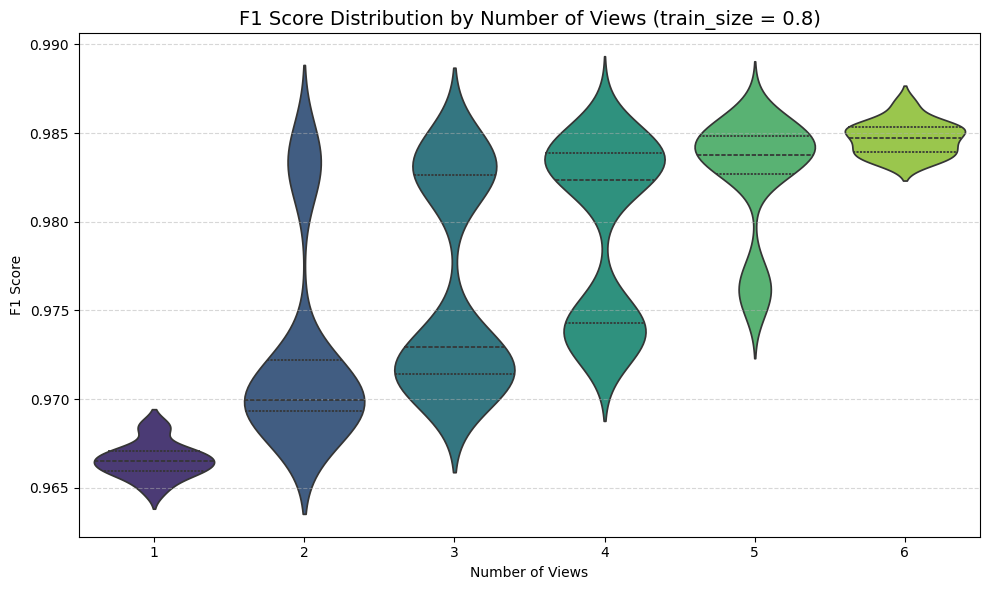

In [11]:
plot_f1_by_view_count(results, train_size=0.8)

## Analysis of models with '0.8' trainsize

### Analysis of model 'original' with '0.8' trainsize (0)

Data from the original model seems to have a normal distribution.

In [11]:
mod_00 = results.get_split(0.8).model_groups["original"]
mod_00_f1 = mod_00.f1_scores()

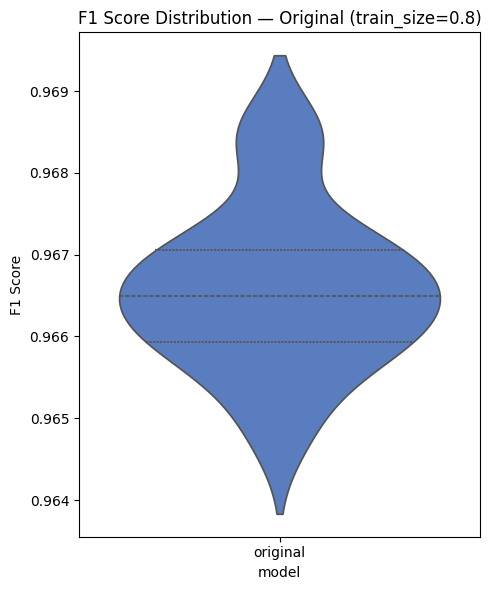

In [12]:
plot_violin_f1(
    f1_scores=mod_00_f1,
    model_name="original",
    title="F1 Score Distribution — Original (train_size=0.8)",
    inner="quartile"
)

### Analysis of model 'tda-original' with '0.8' trainsize (1)

In [15]:
mod_01 = results.get_split(0.8).model_groups["tda-original"]
mod_01_f1 = mod_01.f1_scores()

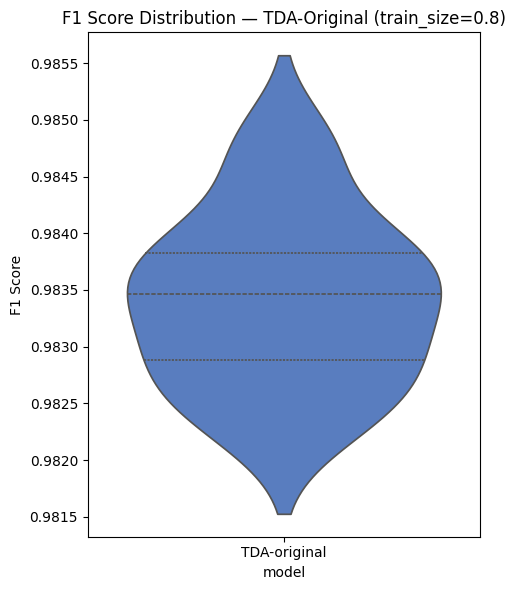

In [16]:
plot_violin_f1(
    f1_scores=mod_01_f1,
    model_name="TDA-original",
    title="F1 Score Distribution — TDA-Original (train_size=0.8)",
    inner="quartile"
)

### Analysis of model 'top_left-original' with '0.8' trainsize

In [17]:
mod_02 = results.get_split(0.8).model_groups["top_left-original"]
mod_02_f1 = mod_02.f1_scores()

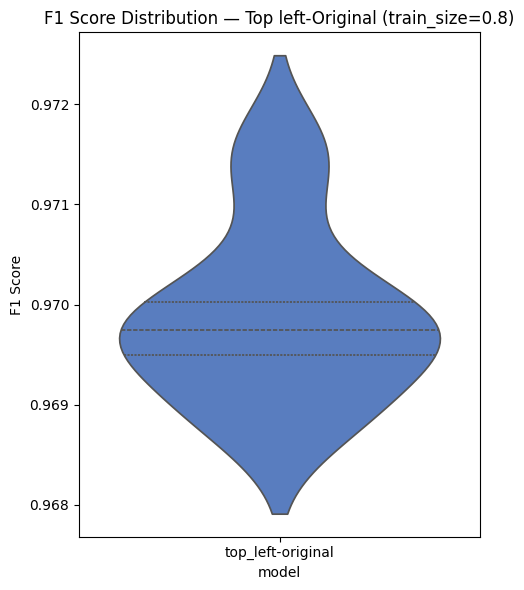

In [18]:
plot_violin_f1(
    f1_scores=mod_02_f1,
    model_name="top_left-original",
    title="F1 Score Distribution — Top left-Original (train_size=0.8)",
    inner="quartile"
)

### Analysis of model 'bottom_left-original' with '0.8' trainsize

### Analysis of model 'original-top_right' with '0.8' trainsize

### Analysis of model 'original-bottom_right' with '0.8' trainsize

### Analysis of model 'tda-original-top_left' with '0.8' trainsize

### Analysis of model 'tda-bottom_left-original' with '0.8' trainsize

### Analysis of model 'tda-original-top_right' with '0.8' trainsize

### Analysis of model 'tda-original-bottom_right' with '0.8' trainsize

### Analysis of model 'top_left-bottom_left_original' with '0.8' trainsize

### Analysis of model 'top_left-original-top_right' with '0.8' trainsize

### Analysis of model 'top_left-original-bottom_right' with '0.8' trainsize

### Analysis of model 'bottom_left-original-top_right' with '0.8' trainsize

### Analysis of model 'bottom_left-original-bottom_right' with '0.8' trainsize

### Analysis of model 'bottom_right-original-top_right' with '0.8' trainsize

### Analysis of model 'tda-bottom_left-original-top_left' with '0.8' trainsize

### Analysis of model 'tda-original-top_right-top_left' with '0.8' trainsize

### Analysis of model 'tda-bottom_right-original-top_left' with '0.8' trainsize

### Analysis of model 'tda-bottom_left-original-top_right' with '0.8' trainsize

### Analysis of model 'tda-bottom_left-original-bottom_right' with '0.8' trainsize

### Analysis of model 'tda-bottom_right-original-top_right' with '0.8' trainsize

### Analysis of model 'top_left-bottom_left-original-top_right' with '0.8' trainsize

### Analysis of model 'top_left-bottom_left-original-bottom_right' with '0.8' trainsize

### Analysis of model 'top_left-bottom_right-original-top_right' with '0.8' trainsize

### Analysis of model 'bottom_right-bottom_left-original-top_right' with '0.8' trainsize

### Analysis of model 'tda-top_left-original-bottom_left-top_right' with '0.8' trainsize

### Analysis of model 'tda-top_left-original-bottom_left-bottom_right' with '0.8' trainsize

### Analysis of model 'tda-top_left_original-top_right-bottom_right' with '0.8' trainsize

### Analysis of model 'tda-original-bottom_left-top_right-bottom_right' with '0.8' trainsize

### Analysis of model 'top_left-original-bottom_left-top_right-bottom_right' with '0.8' trainsize

### Analysis of model 'tda-top_left-original-bottom_left-bottom_right-top_right' with '0.8' trainsize

## Analysis of Models's performance across views

This analysis studies how the model's performance changes while varying the the number of views. The train size remains fixed. We think that the models may improve as the number of views increases. We define the improvement as an increment in the average f1-score. And we consider only two comparisons between the previous number of views and the actual. The hypothesis are:
- $H_0$: $\mu_\text{view+1} \leq \mu_\text{view}$
- $H_0$: $\mu_\text{view+1} > \mu_\text{view}$ 

In [2]:
exp_name = "exp_icecream"

results_path = Path.cwd() / "results" / exp_name

### Analysis performance fix 0.1 train size

/home/jovyan/Workspace/workspace_mnist/results/exp_icecream/experiment_trainsize_predictions_2025-03-12_00-55-59.json
/home/jovyan/Workspace/workspace_mnist/results/exp_icecream/experiment_trainsize_predictions_2025-03-14_01-40-20.json
/home/jovyan/Workspace/workspace_mnist/results/exp_icecream/experiment_trainsize_predictions_2025-03-13_09-22-51.json
/home/jovyan/Workspace/workspace_mnist/results/exp_icecream/experiment_trainsize_predictions_2025-03-12_16-47-54.json
/home/jovyan/Workspace/workspace_mnist/results/exp_icecream/experiment_trainsize_predictions_2025-03-12_23-06-59.json
/home/jovyan/Workspace/workspace_mnist/results/exp_icecream/experiment_trainsize_predictions_2025-03-14_00-28-03.json
/home/jovyan/Workspace/workspace_mnist/results/exp_icecream/experiment_trainsize_predictions_2025-03-13_00-25-28.json
/home/jovyan/Workspace/workspace_mnist/results/exp_icecream/experiment_trainsize_predictions_2025-04-08_14-47-32.json
/home/jovyan/Workspace/workspace_mnist/results/exp_icecr

In [ ]:
result_summary = analyze_experiments(results_path)

In [ ]:
noise = "Lines"
quantity = "50"
unit = "pixels"

title_plot = f"{noise} noise ({quantity} noisy {unit}) Raw data vs MVStacking-TDA across metrics"
plot_tda_comparison(result_summary, title_plot)

- Comentario:
- sacar p value por training split, en lugar del average.
- buscar sobre prueba pareada
- dejar solamente grafica f1-score

### Results:
- hypothesis test: exp_noise_icecream: t-test, accuracy, greater, Test statistic: -3.7308, pvalue: 0.99.
- hypothesis test: exp_noise_icecream: t-test, accuracy, two-sideed, Test statistic: -3.7308, pvalue: 0.0001.

In [ ]:
split_data = group_by_split(results_path)
stat, pval = perform_statistical_test(split_data, metric="accuracy", test_type="t-test", alternative="less")

print(f"Test Statistic: {stat:.4f}, P-value: {pval}")


In [ ]:
import os
import json
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def analyze_experiments_multiview(directory):
    """
    Analyzes experiment results for a multiview learning paradigm, stored in JSON files.
    For each training split percentage, the function computes separate metrics
    grouped by the number of views in the model name.

    Each JSON file must contain:
      - "train_split_percentage" (int)
      - "results" (dict or list) describing the models. Each model has:
          * "model_name" (str) with one or more views joined by '-', e.g. "original-tda-top_left"
          * "predictions" (list of predicted labels)
          * "ground_truth" (list of true labels)

    Steps:
      1) Group JSON files by 'train_split_percentage'.
      2) For each file, parse each model's metrics (accuracy, precision, recall, f1-score),
         and include error_rate = (1 - accuracy).
      3) Group models by the number of views in the model name, e.g. "original-tda-top_left"
         has 3 views.
      4) Compute mean and standard deviation of all metrics for each group of views.

    :param directory: Path to the directory containing the JSON files.
    :return: A dictionary with structure:

      {
        <train_split_percentage>: {
          "files": [filename1.json, filename2.json, ...],
          "views_count_metrics": {
            <num_views>: {
              "mean_metrics": {
                "accuracy": float,
                "precision": float,
                "recall": float,
                "f1_score": float,
                "error_rate": float
              },
              "std_metrics": {
                "accuracy": float,
                "precision": float,
                "recall": float,
                "f1_score": float,
                "error_rate": float
              }
            },
            ...
          }
        },
        ...
      }

    Example usage:
      result_summary = analyze_experiments_multiview('./path/to/jsons')
      print(result_summary)
    """

    # Dictionary to store data grouped by train_split_percentage
    # Each entry will hold a dictionary of "files" + "views_count_metrics"
    split_groups = {}

    # Step 1: Read all JSON files in the directory and group them by split percentage
    for filename in os.listdir(directory):
        if not filename.lower().endswith(".json"):
            continue  # Skip non-JSON files

        filepath = os.path.join(directory, filename)
        try:
            with open(filepath, "r") as f:
                data = json.load(f)
        except (json.JSONDecodeError, FileNotFoundError):
            # Skip files that cannot be opened or parsed
            continue

        split_percentage = data.get("train_split_percentage")
        if split_percentage is None:
            # If key is missing, skip this file
            continue

        # Initialize structure if not present
        if split_percentage not in split_groups:
            split_groups[split_percentage] = {
                "files": [],
                "views_count_metrics": {}  # will map num_views -> list of (acc, prec, rec, f1, err)
            }

        split_groups[split_percentage]["files"].append(filename)

        # Retrieve results (could be dict or list)
        results = data.get("results", {})

        # Helper to record metrics for a given model
        def record_metrics(model_name, predictions, ground_truth):
            if len(predictions) != len(ground_truth) or len(predictions) == 0:
                return  # skip invalid data

            # Compute metrics
            acc = accuracy_score(ground_truth, predictions)
            prec = precision_score(ground_truth, predictions, average='macro', zero_division=0)
            rec = recall_score(ground_truth, predictions, average='macro', zero_division=0)
            f1 = f1_score(ground_truth, predictions, average='macro', zero_division=0)
            err = 1.0 - acc

            # Determine how many views this model name contains
            # e.g. "original-tda-top_left" => 3 views
            num_views = len(model_name.split('-'))

            # Insert into the list for that view count
            if num_views not in split_groups[split_percentage]["views_count_metrics"]:
                split_groups[split_percentage]["views_count_metrics"][num_views] = []
            split_groups[split_percentage]["views_count_metrics"][num_views].append(
                (acc, prec, rec, f1, err)
            )

        # Step 2: Loop over each model in 'results'
        if isinstance(results, dict):
            # Format: { "modelA": {...}, "modelB": {...} }
            for mkey, minfo in results.items():
                model_name = minfo.get("model_name", mkey)
                preds = minfo.get("predictions", [])
                gts = minfo.get("ground_truth", [])
                record_metrics(model_name, preds, gts)
        elif isinstance(results, list):
            # Format: [ { "model_name": ..., "predictions": ..., "ground_truth": ... }, ... ]
            for minfo in results:
                model_name = minfo.get("model_name", "unknown_model")
                preds = minfo.get("predictions", [])
                gts = minfo.get("ground_truth", [])
                record_metrics(model_name, preds, gts)
        else:
            # Neither dict nor list, ignore
            pass

    # Step 3: Aggregate metrics and compute mean + std for each split percentage and each num_views
    summary = {}

    for split_percentage, info in split_groups.items():
        summary[split_percentage] = {
            "files": info["files"],
            "views_count_metrics": {}
        }

        # info["views_count_metrics"] maps num_views -> list of (acc, prec, rec, f1, err)
        for nviews, metric_list in info["views_count_metrics"].items():
            arr = np.array(metric_list, dtype=float)  # shape: (N, 5)
            if arr.size == 0:
                continue

            # Mean across each column
            mean_vals = arr.mean(axis=0)
            # Sample standard deviation
            std_vals = arr.std(axis=0, ddof=1)

            # Map from index to metric name
            # 0: accuracy, 1: precision, 2: recall, 3: f1_score, 4: error_rate
            summary[split_percentage]["views_count_metrics"][nviews] = {
                "mean_metrics": {
                    "accuracy": float(mean_vals[0]),
                    "precision": float(mean_vals[1]),
                    "recall": float(mean_vals[2]),
                    "f1_score": float(mean_vals[3]),
                    "error_rate": float(mean_vals[4])
                },
                "std_metrics": {
                    "accuracy": float(std_vals[0]),
                    "precision": float(std_vals[1]),
                    "recall": float(std_vals[2]),
                    "f1_score": float(std_vals[3]),
                    "error_rate": float(std_vals[4])
                }
            }

    return summary


In [ ]:
analysis_number_views = analyze_experiments_multiview(results_path)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_multiview_comparison(summary):
    """
    Plots five metrics (Accuracy, Precision, Recall, F1-Score, Error Rate) for each
    training split percentage, comparing different numbers of views in the model name.

    The 'summary' dict is assumed to come from 'analyze_experiments_multiview', with structure:
      {
        <train_split_percentage>: {
          "files": [...],
          "views_count_metrics": {
            <num_views>: {
              "mean_metrics": {
                  "accuracy": float,
                  "precision": float,
                  "recall": float,
                  "f1_score": float,
                  "error_rate": float
              },
              "std_metrics": {
                  "accuracy": float,
                  "precision": float,
                  "recall": float,
                  "f1_score": float,
                  "error_rate": float
              }
            },
            ...
          }
        },
        ...
      }
    """

    # Sort training splits (x-axis)
    split_percentages = sorted(summary.keys())

    # Collect all distinct 'number of views' from all splits
    # so we know which lines to draw
    all_views_counts = set()
    for sp in split_percentages:
        views_dict = summary[sp].get("views_count_metrics", {})
        all_views_counts.update(views_dict.keys())

    # Sort the distinct #views so the legend is in ascending order
    all_views_counts = sorted(all_views_counts)

    # We'll plot these five metrics
    metrics = ["accuracy", "precision", "recall", "f1_score", "error_rate"]
    metric_titles = ["Accuracy", "Precision", "Recall", "F1-Score", "Error Rate"]

    # Create 5 subplots in a 3x2 grid (the 6th one remains unused)
    fig, axes = plt.subplots(3, 2, figsize=(12, 10))
    axes = axes.flatten()  # Flatten to iterate easily

    # Helper: For a given metric, gather lines for each #views across all training splits
    def gather_metric_data(metric):
        # lines_data will map nviews -> (means_list, stds_list)
        lines_data = {}

        for nviews in all_views_counts:
            means = []
            stds = []
            for sp in split_percentages:
                # Retrieve the metrics for this #views at this split
                view_info = summary[sp]["views_count_metrics"].get(nviews)
                if view_info is not None:
                    mean_val = view_info["mean_metrics"].get(metric, np.nan)
                    std_val = view_info["std_metrics"].get(metric, 0.0)
                else:
                    # If there is no data for that #views at this split, store NaN / 0
                    mean_val = np.nan
                    std_val = 0.0

                means.append(mean_val)
                stds.append(std_val)
            lines_data[nviews] = (np.array(means), np.array(stds))
        return lines_data

    # Generate a subplot for each metric
    for i, (metric, title) in enumerate(zip(metrics, metric_titles)):
        # If we have fewer metrics than the number of axes, we handle it
        if i >= len(axes):
            break

        ax = axes[i]
        lines_data = gather_metric_data(metric)

        # Plot one line per #views
        for nviews, (means, stds) in lines_data.items():
            ax.errorbar(
                split_percentages, means, yerr=stds, fmt='-o',
                label=f"{nviews} view(s)"
            )

        ax.set_title(title)
        ax.set_xlabel("Training Split (%)")
        ax.set_ylabel("Metric Value")
        ax.grid(True, linestyle='--', alpha=0.7)
        ax.legend()

    # Hide any unused subplot if 5 < 6
    if len(metrics) < len(axes):
        axes[-1].set_visible(False)

    plt.tight_layout()
    plt.show()

In [ ]:

plot_multiview_comparison(analysis_number_views)


In [ ]:
import os
import json
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from collections import defaultdict

def analyze_experiments_multiview_with_raw(directory):
    """
    Extends 'analyze_experiments_multiview' to store per-model metrics for each (split_percentage, num_views).
    This is necessary for pairwise t-tests.

    :param directory: Path to the directory containing JSON files.
    :return: data_dict with structure:
      {
        <train_split_percentage>: {
          "files": [...],
          "views_count_models": {
            <num_views>: {
              "accuracy": [...],
              "precision": [...],
              "recall": [...],
              "f1_score": [...],
              "error_rate": [...]
            },
            ...
          }
        },
        ...
      }
    """

    # This dict will store raw metrics for each split and each number of views
    data_dict = {}

    for filename in os.listdir(directory):
        if not filename.lower().endswith(".json"):
            continue
        filepath = os.path.join(directory, filename)

        try:
            with open(filepath, 'r') as f:
                data = json.load(f)
        except (json.JSONDecodeError, FileNotFoundError):
            continue  # skip unreadable/invalid files

        split_percentage = data.get("train_split_percentage")
        if split_percentage is None:
            continue

        if split_percentage not in data_dict:
            data_dict[split_percentage] = {
                "files": [],
                "views_count_models": defaultdict(lambda: {
                    "accuracy": [],
                    "precision": [],
                    "recall": [],
                    "f1_score": [],
                    "error_rate": []
                })
            }

        data_dict[split_percentage]["files"].append(filename)

        results = data.get("results", {})

        def record_metrics(model_name, preds, gts):
            if len(preds) != len(gts) or len(preds) == 0:
                return
            acc = accuracy_score(gts, preds)
            prec = precision_score(gts, preds, average='macro', zero_division=0)
            rec = recall_score(gts, preds, average='macro', zero_division=0)
            f1 = f1_score(gts, preds, average='macro', zero_division=0)
            err = 1.0 - acc

            num_views = len(model_name.split('-'))
            vc_models = data_dict[split_percentage]["views_count_models"][num_views]
            vc_models["accuracy"].append(acc)
            vc_models["precision"].append(prec)
            vc_models["recall"].append(rec)
            vc_models["f1_score"].append(f1)
            vc_models["error_rate"].append(err)

        # Collect metrics for each model
        if isinstance(results, dict):
            for mkey, minfo in results.items():
                model_name = minfo.get("model_name", mkey)
                record_metrics(model_name,
                               minfo.get("predictions", []),
                               minfo.get("ground_truth", []))
        elif isinstance(results, list):
            for minfo in results:
                model_name = minfo.get("model_name", "unknown_model")
                record_metrics(model_name,
                               minfo.get("predictions", []),
                               minfo.get("ground_truth", []))
        else:
            pass

    return data_dict


In [ ]:
results_exp_ttest = analyze_experiments_multiview_with_raw(results_path)

In [ ]:
import itertools
from scipy.stats import ttest_ind

def pairwise_ttest_multiview(data_dict):
    """
    Performs pairwise t-tests for each training-split percentage, comparing
    metrics across different numbers of views.

    :param data_dict: The dictionary returned by `analyze_experiments_multiview_with_raw`,
                      which stores raw metrics for each (split_percentage, num_views).
    :return: A dictionary containing p-values and t-statistics for all pairs of #views:
      {
        <train_split_percentage>: {
          (<views1>, <views2>): {
            "accuracy": (t_stat, p_val),
            "precision": (t_stat, p_val),
            "recall": (t_stat, p_val),
            "f1_score": (t_stat, p_val),
            "error_rate": (t_stat, p_val)
          },
          ...
        },
        ...
      }
    """

    all_results = {}
    metrics = ["accuracy", "precision", "recall", "f1_score", "error_rate"]

    for sp, info in data_dict.items():
        vc_models = info["views_count_models"]  # e.g. {2: {...}, 3: {...}}

        # Sort #views so that the output is stable
        views_counts = sorted(vc_models.keys())

        # We'll store t-test results for all pairs in a dict
        sp_results = {}

        # Compare each pair of #views
        for v1, v2 in itertools.combinations(views_counts, 2):
            sp_results[(v1, v2)] = {}
            group1 = vc_models[v1]
            group2 = vc_models[v2]

            for metric in metrics:
                data1 = group1[metric]
                data2 = group2[metric]

                # If either group has <2 data points, skip or do trivial
                if len(data1) < 2 or len(data2) < 2:
                    sp_results[(v1, v2)][metric] = (None, None)
                    continue

                # Perform two-sample t-test (unequal variances)
                t_stat, p_val = ttest_ind(data1, data2, equal_var=False)
                if p_val > 0.5:
                    print(f"Warning")
                sp_results[(v1, v2)][metric] = (t_stat, p_val)

        # Save the pairwise results for this training split
        all_results[sp] = sp_results

    return all_results


In [ ]:
ttest_results = pairwise_ttest_multiview(results_exp_ttest)


In [ ]:
# Example snippet to display only those comparisons with p_value > 0.005
for sp, comparisons in ttest_results.items():
    print(f"\nTraining split = {sp}%")
    for (v1, v2), metric_dict in comparisons.items():
        # We'll check each metric's p_value
        for metric, (t_stat, p_val) in metric_dict.items():
            # If there's not enough data (None), skip
            if t_stat is None:
                continue
            if p_val > 0.005:
                print(f"  #views {v1} vs. {v2}, {metric}: p_val = {p_val:.4f} (t_stat = {t_stat:.3f})")


In [ ]:
import os
import json
import numpy as np
from collections import defaultdict
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def analyze_experiments_multiview_raw(directory):
    """
    Reads experiment results from JSON files for a multiview learning paradigm
    and stores the RAW predictions & ground truths per (train_split, num_views).

    JSON assumptions:
      - "train_split_percentage" (int)
      - "results" (dict or list) describing the models:
          * "model_name": e.g. "original-tda-top_left" => 3 views
          * "predictions": list of predicted labels
          * "ground_truth": list of true labels

    Returns a dictionary:
      {
        <train_split_percentage>: {
          "files": [...],
          "views_data": {
             <num_views>: {
               "predictions": [all preds from models with num_views],
               "ground_truth": [all gts from models with num_views]
             },
             ...
          }
        },
        ...
      }
    """

    data_dict = {}

    for filename in os.listdir(directory):
        if not filename.lower().endswith(".json"):
            continue  # Skip non-JSON
        filepath = os.path.join(directory, filename)

        try:
            with open(filepath, 'r') as f:
                data = json.load(f)
        except (json.JSONDecodeError, FileNotFoundError):
            continue  # Skip invalid/unreadable

        split_percentage = data.get("train_split_percentage")
        if split_percentage is None:
            continue

        # Ensure structure
        if split_percentage not in data_dict:
            data_dict[split_percentage] = {
                "files": [],
                "views_data": defaultdict(lambda: {
                    "predictions": [],
                    "ground_truth": []
                })
            }

        data_dict[split_percentage]["files"].append(filename)

        # Extract results
        results = data.get("results", {})

        def store_raw(model_name, preds, gts):
            if len(preds) != len(gts) or len(preds) == 0:
                return
            num_views = len(model_name.split('-'))
            data_dict[split_percentage]["views_data"][num_views]["predictions"].extend(preds)
            data_dict[split_percentage]["views_data"][num_views]["ground_truth"].extend(gts)

        if isinstance(results, dict):
            # { "modelA": {...}, "modelB": {...} }
            for mkey, minfo in results.items():
                model_name = minfo.get("model_name", mkey)
                store_raw(model_name,
                          minfo.get("predictions", []),
                          minfo.get("ground_truth", []))
        elif isinstance(results, list):
            # [ {...}, {...} ]
            for minfo in results:
                model_name = minfo.get("model_name", "unknown_model")
                store_raw(model_name,
                          minfo.get("predictions", []),
                          minfo.get("ground_truth", []))

    return data_dict


In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrices_multiview(data_dict, normalize=None):
    """
    Creates confusion matrices for each (train_split_percentage, num_views) group.
    - data_dict: dict returned by analyze_experiments_multiview_raw
    - normalize: 'true', 'pred', 'all', or None (passed to confusion_matrix for normalization)

    The function produces multiple figures. Each figure = a single training split.
    Within each figure, each subplot = a specific #views group.
    """

    # Sort by train split
    sorted_splits = sorted(data_dict.keys())

    for sp in sorted_splits:
        # Prepare subplots: one confusion matrix per #views group
        views_data = data_dict[sp]["views_data"]
        all_views = sorted(views_data.keys())

        if not all_views:
            # No data for this split
            continue

        # We'll make a grid with up to 3 columns (adjust as needed)
        n_groups = len(all_views)
        n_cols = 3
        n_rows = (n_groups + n_cols - 1) // n_cols  # ceiling division

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
        axes = axes.flatten() if n_groups > 1 else [axes]

        fig.suptitle(f"Confusion Matrices @ {sp}% Training Split", fontsize=16)

        for i, nviews in enumerate(all_views):
            ax = axes[i]
            preds = views_data[nviews]["predictions"]
            gts   = views_data[nviews]["ground_truth"]

            # Build confusion matrix
            cm = confusion_matrix(gts, preds, normalize=normalize)

            # Display
            disp = ConfusionMatrixDisplay(cm)
            disp.plot(ax=ax, values_format='.2f' if normalize else 'd', cmap='Blues')
            ax.set_title(f"{nviews} View(s)")

        # Hide extra axes if any
        for j in range(i + 1, len(axes)):
            axes[j].set_visible(False)

        plt.tight_layout()
        plt.show()


In [ ]:
# Step A: Gather raw data from JSON folder
data_dict = analyze_experiments_multiview_raw("./results/exp_icecream/")

# Step B: Plot confusion matrices (with row-normalization, for instance)
plot_confusion_matrices_multiview(data_dict, normalize='true')


# Experiment Noise from lines



We have to match the timestamps of the logs with the results because I forgot to add the lines quantity to the json file, so I have to manually classify which files belongs to each quantity category. This files belongs only to the first iteration of the experiments.

In [44]:
from pathlib import Path
from typing import List

def get_n_oldest_files(directory: Path, n: int) -> List[str]:
    """
    Returns the names of the n oldest files in a directory, sorted from oldest to newest.

    Args:
        directory (Path): Path to the directory containing files.
        n (int): Number of oldest files to retrieve.

    Returns:
        List[str]: List of filenames, sorted oldest to newest.
    """
    files = [file for file in directory.iterdir() if file.is_file()]
    sorted_files = sorted(files, key=lambda f: f.stat().st_mtime)
    oldest_files = sorted_files[:n]
    
    return [file.name for file in oldest_files]


In [2]:
path_exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
n_oldest_files = get_n_oldest_files(path_exp_dir, n=425)

base_path = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
full_paths = [base_path / filename for filename in n_oldest_files]

In [7]:
list(range(1,50+1,2))

[1,
 3,
 5,
 7,
 9,
 11,
 13,
 15,
 17,
 19,
 21,
 23,
 25,
 27,
 29,
 31,
 33,
 35,
 37,
 39,
 41,
 43,
 45,
 47,
 49]

In [47]:
from analysis.metrics_extraction import show_metrics_per_model, plot_f1_scores
from pathlib import Path

In [2]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q1_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_01-56-00.json"


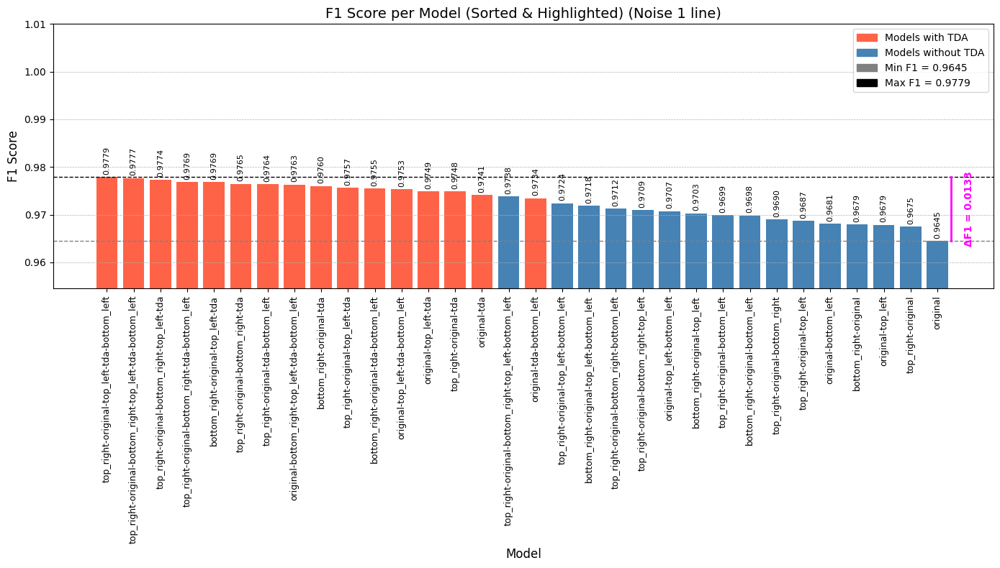

In [4]:
plot_f1_scores(exp_q1_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 1 line)")

In [5]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q3_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_02-22-59.json"


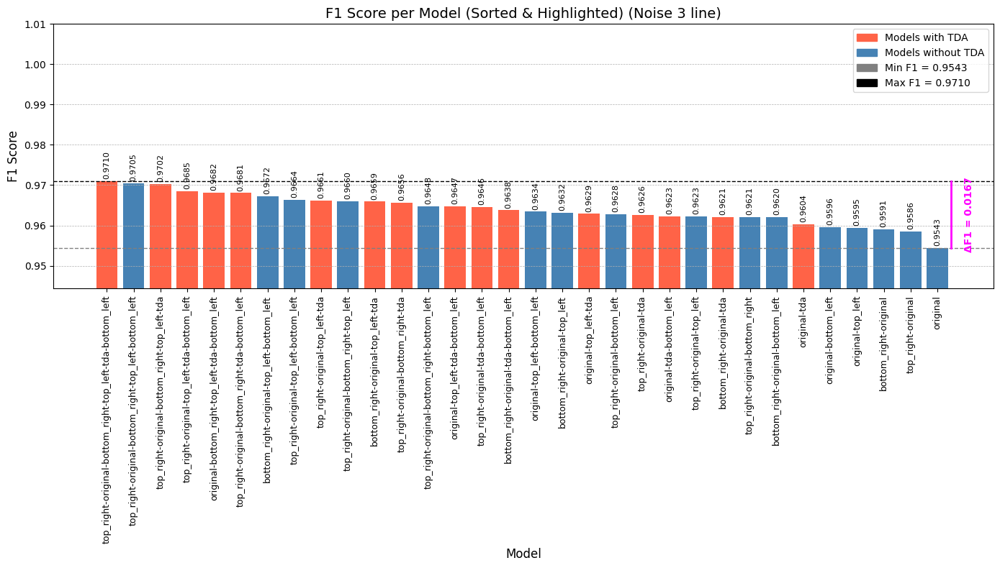

In [6]:
plot_f1_scores(exp_q3_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 3 line)")

In [7]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q5_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_02-50-28.json"


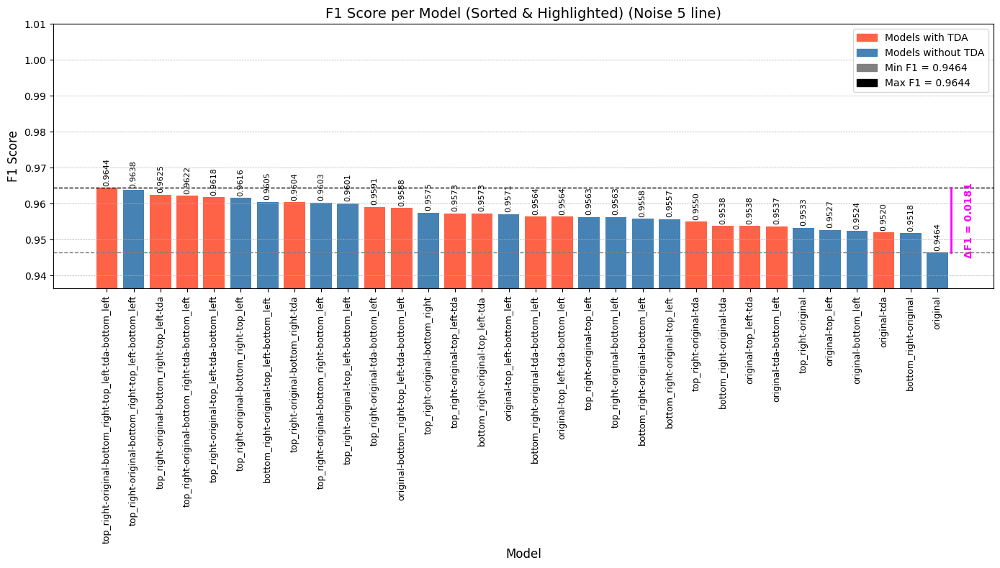

In [8]:
plot_f1_scores(exp_q5_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 5 line)")

In [9]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q7_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_03-18-18.json"


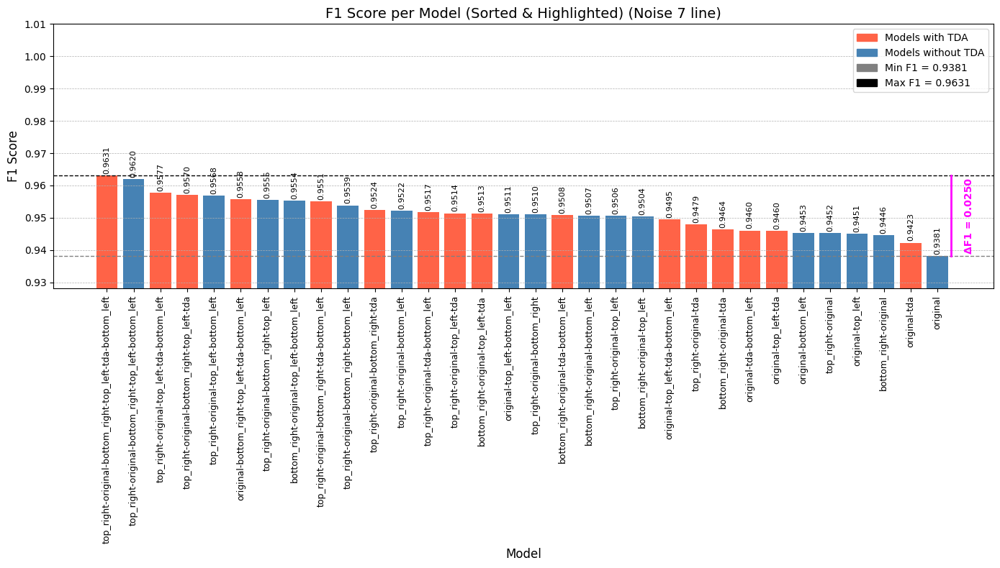

In [10]:
plot_f1_scores(exp_q7_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 7 line)")

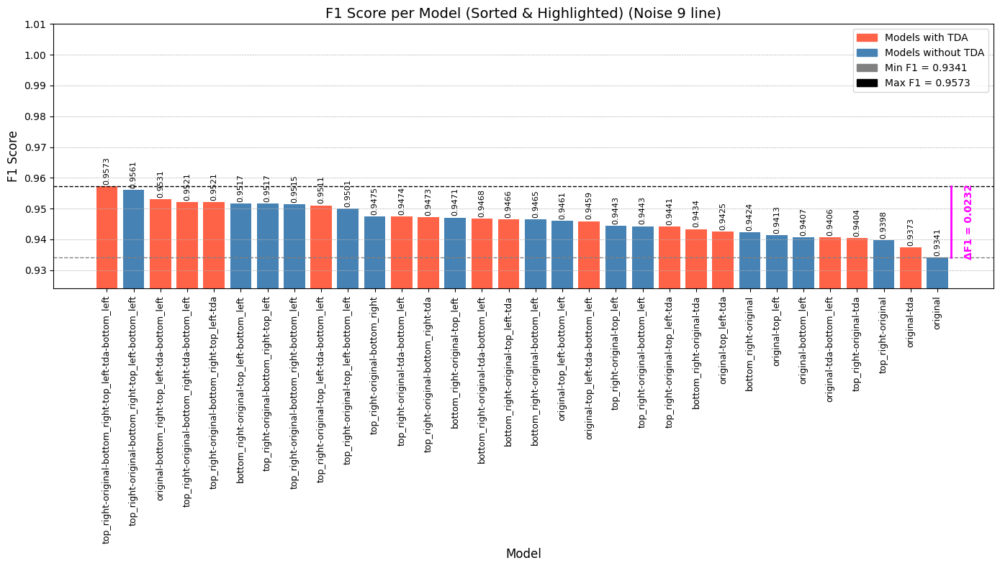

In [11]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q9_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_03-46-35.json"
plot_f1_scores(exp_q9_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 9 line)")

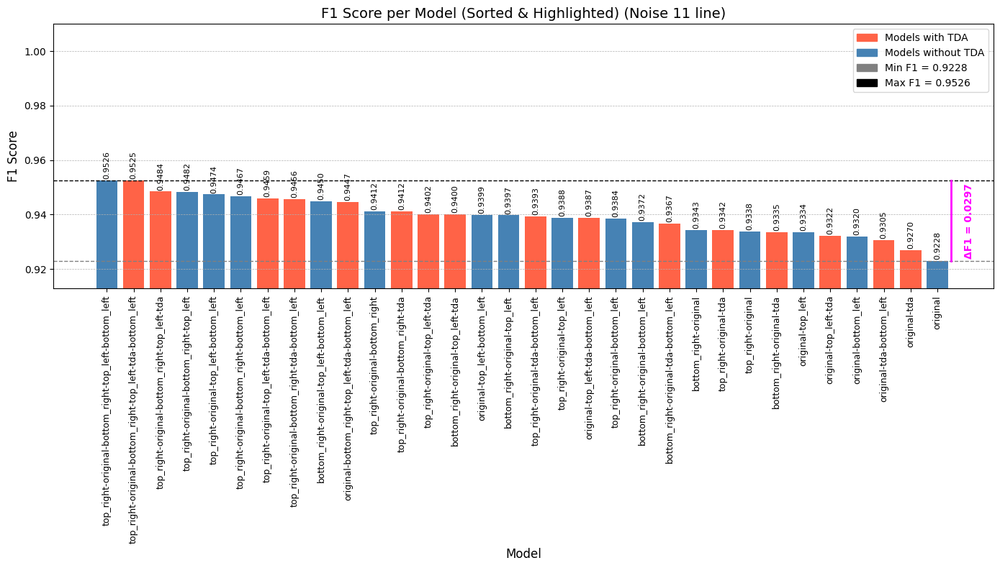

In [12]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q11_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_04-15-29.json"
plot_f1_scores(exp_q11_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 11 line)")

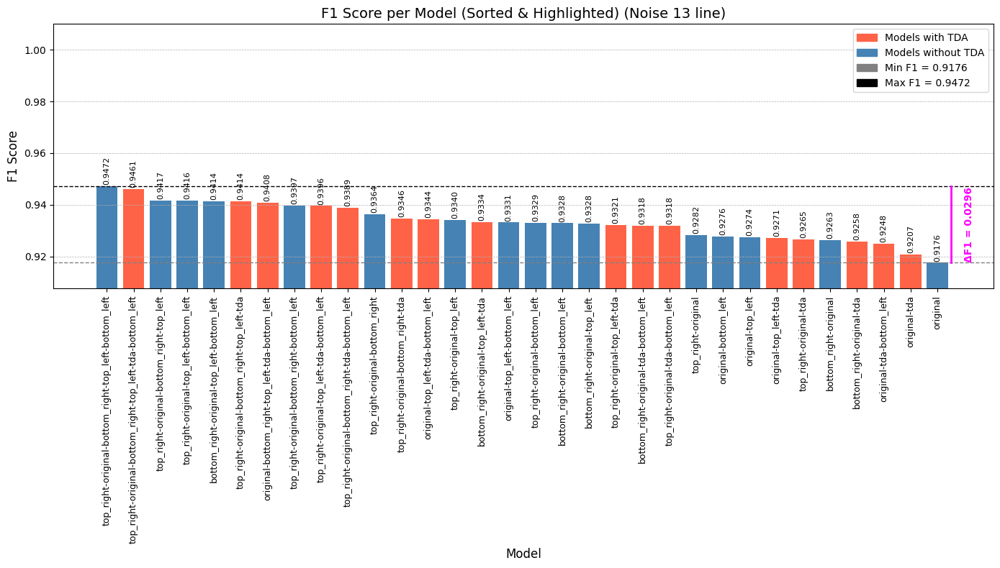

In [13]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q13_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_04-44-19.json"
plot_f1_scores(exp_q13_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 13 line)")

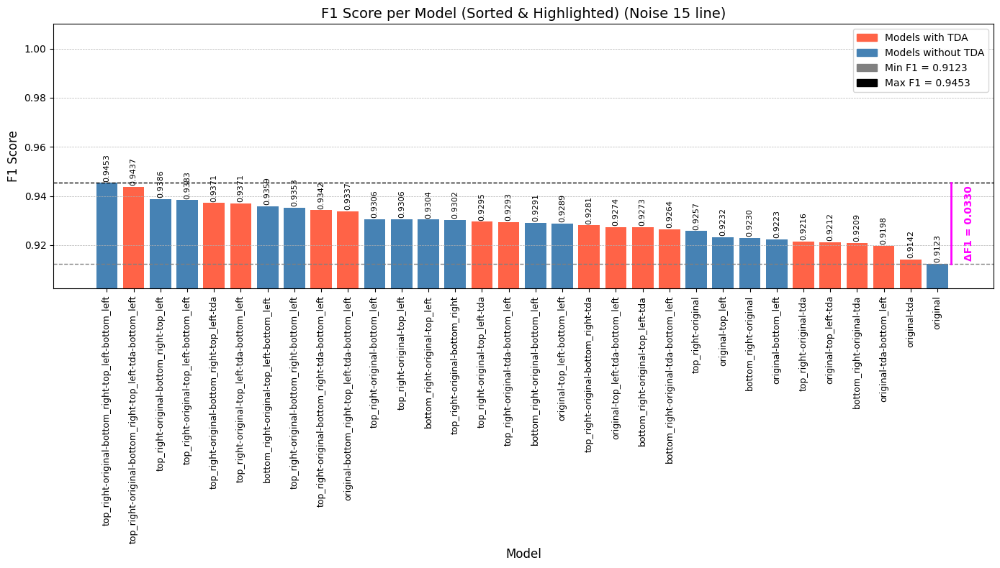

In [14]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q15_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_05-13-30.json"
plot_f1_scores(exp_q15_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 15 line)")

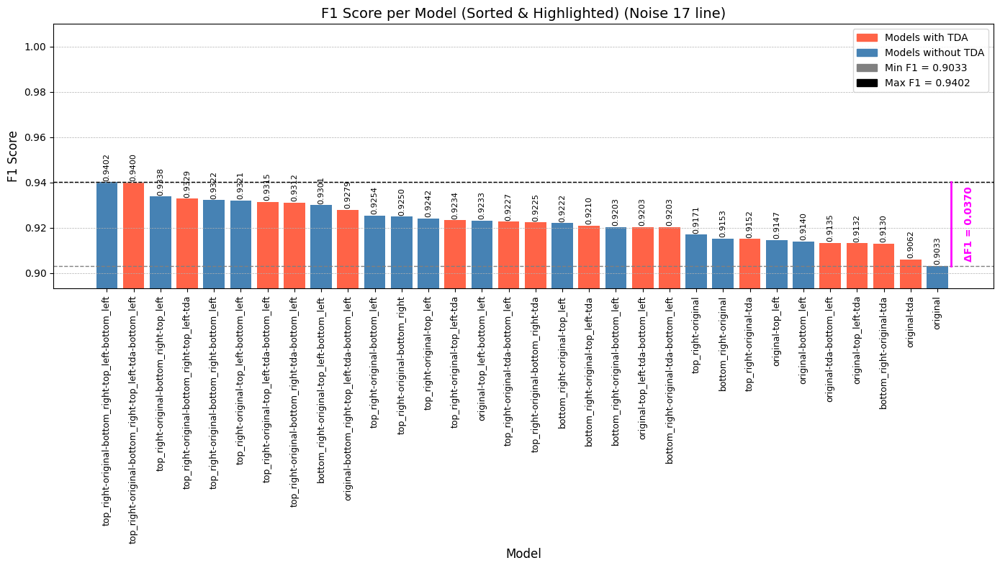

In [15]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q17_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_05-43-17.json"
plot_f1_scores(exp_q17_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 17 line)")

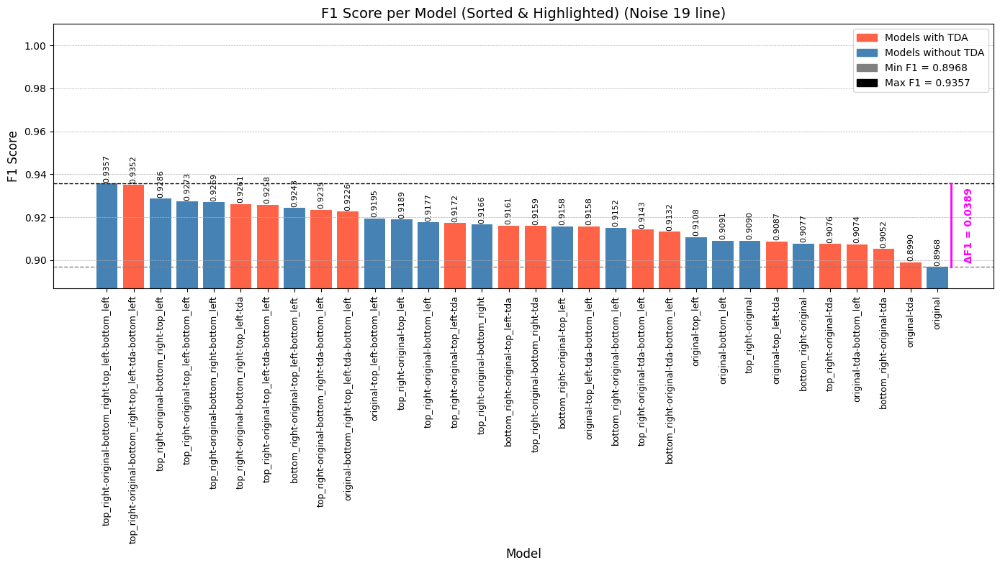

In [16]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q19_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_06-12-13.json"
plot_f1_scores(exp_q19_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 19 line)")

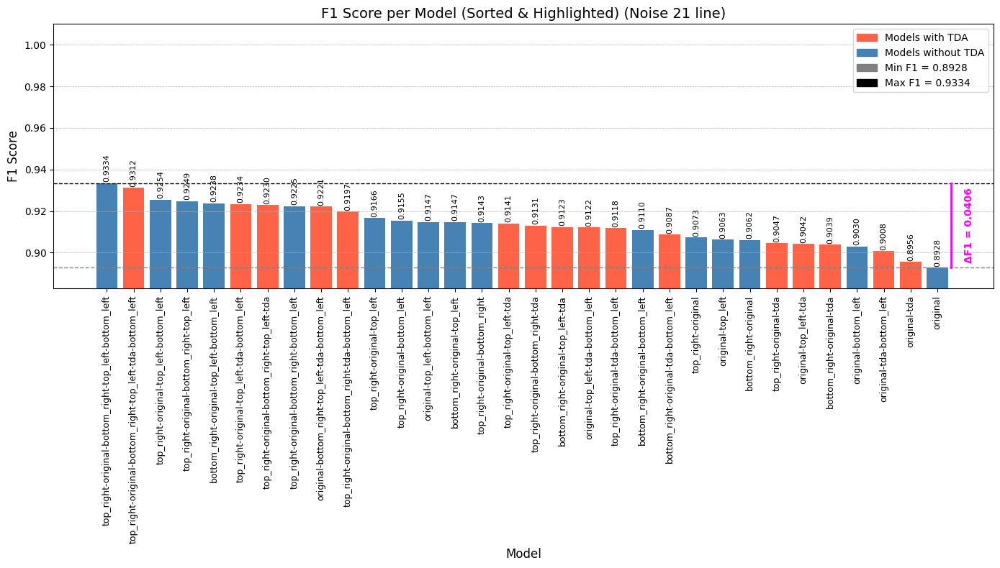

In [17]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q21_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_06-41-59.json"
plot_f1_scores(exp_q21_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 21 line)")

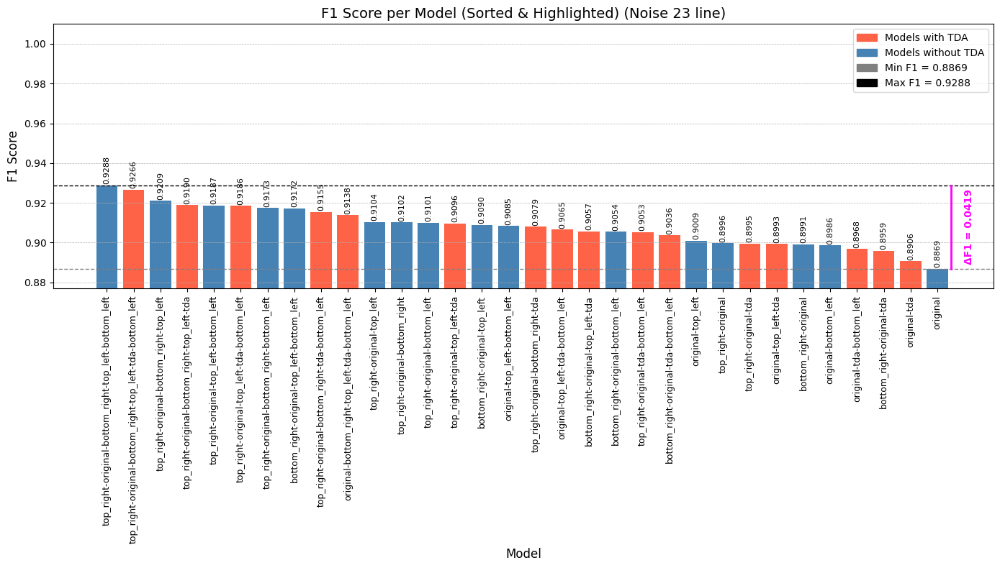

In [18]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q23_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_07-12-16.json"
plot_f1_scores(exp_q23_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 23 line)")

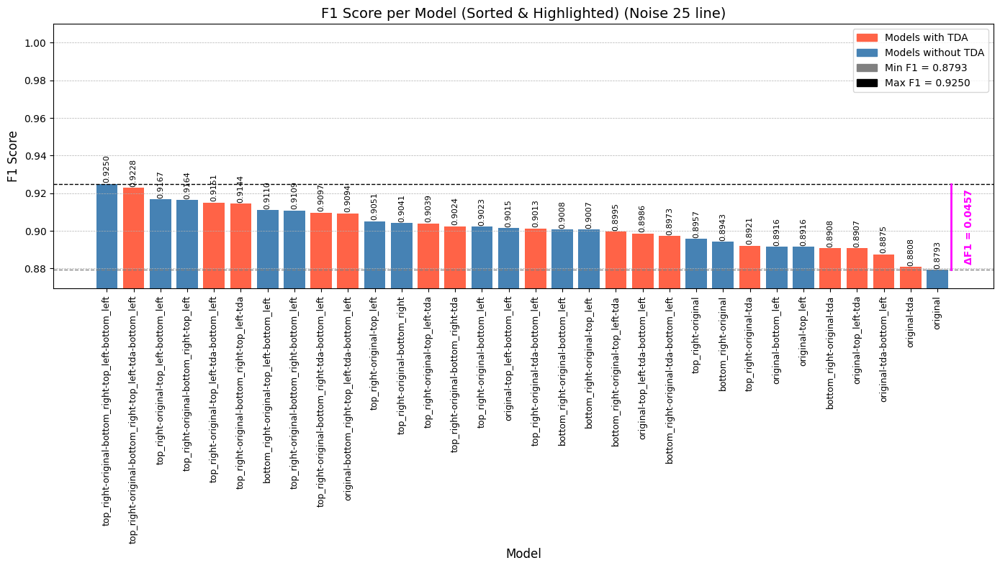

In [19]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q25_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_07-42-56.json"
plot_f1_scores(exp_q25_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 25 line)")

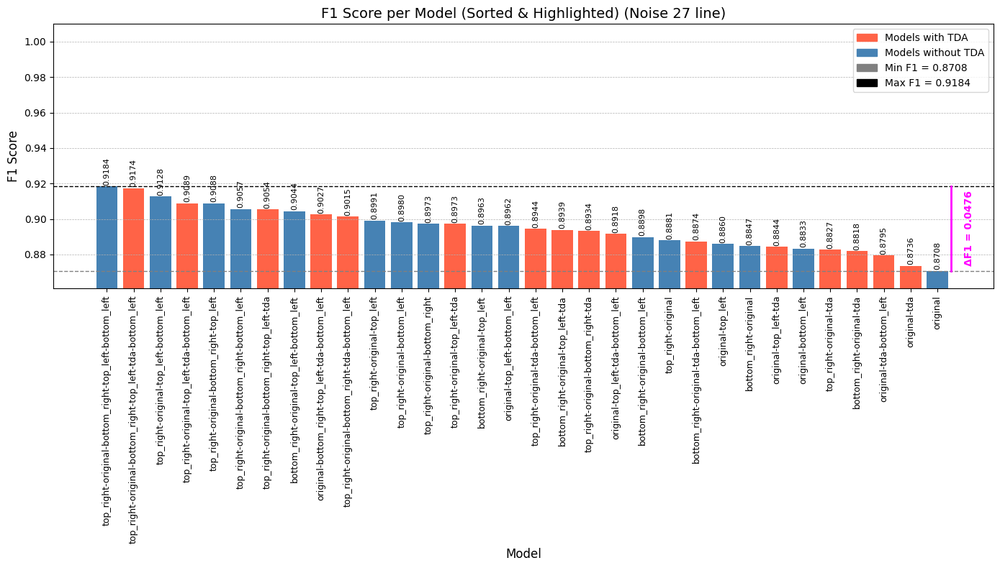

In [20]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q27_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_08-12-21.json"
plot_f1_scores(exp_q27_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 27 line)")

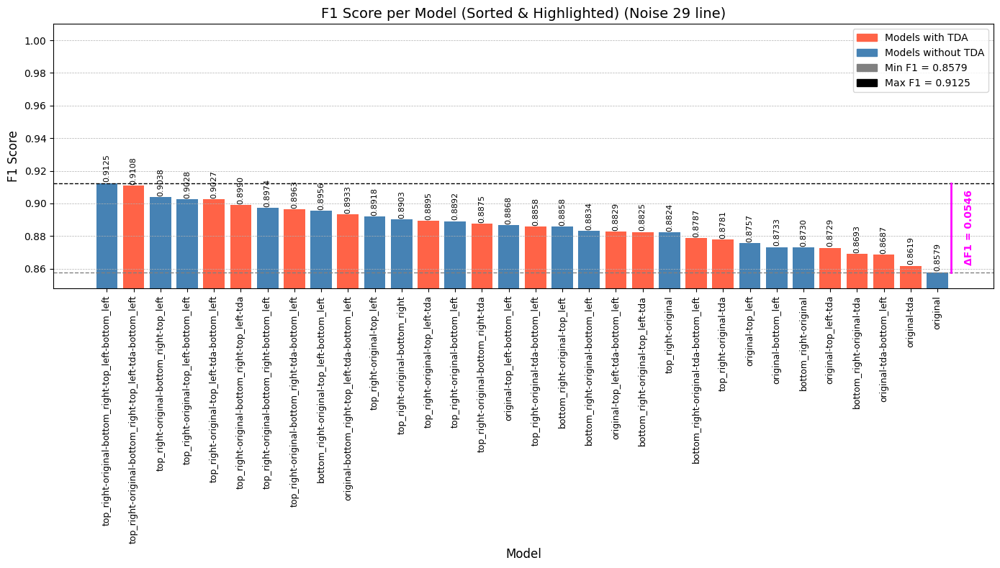

In [21]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q29_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_08-41-52.json"
plot_f1_scores(exp_q29_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 29 line)")

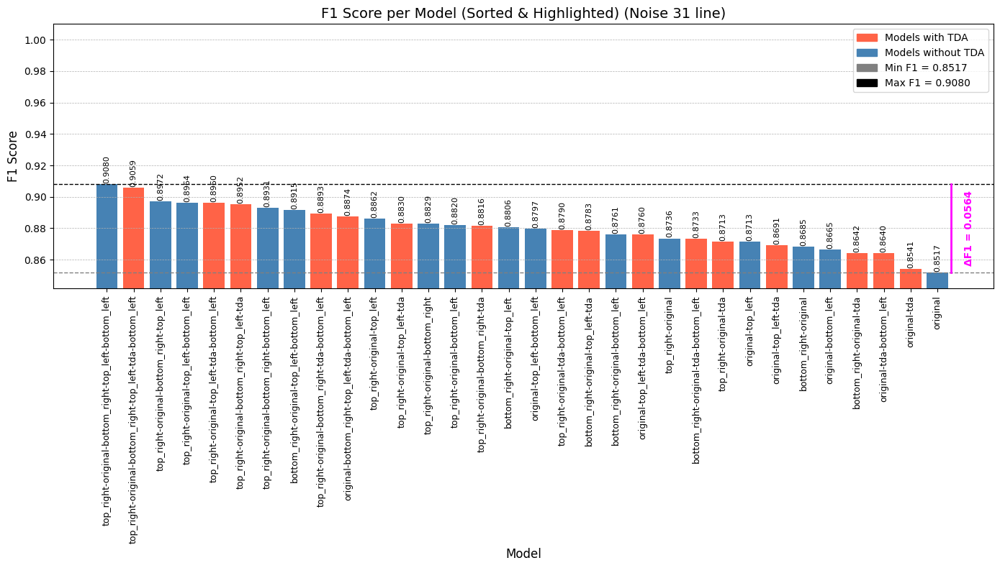

In [22]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q31_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_09-11-51.json"
plot_f1_scores(exp_q31_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 31 line)")

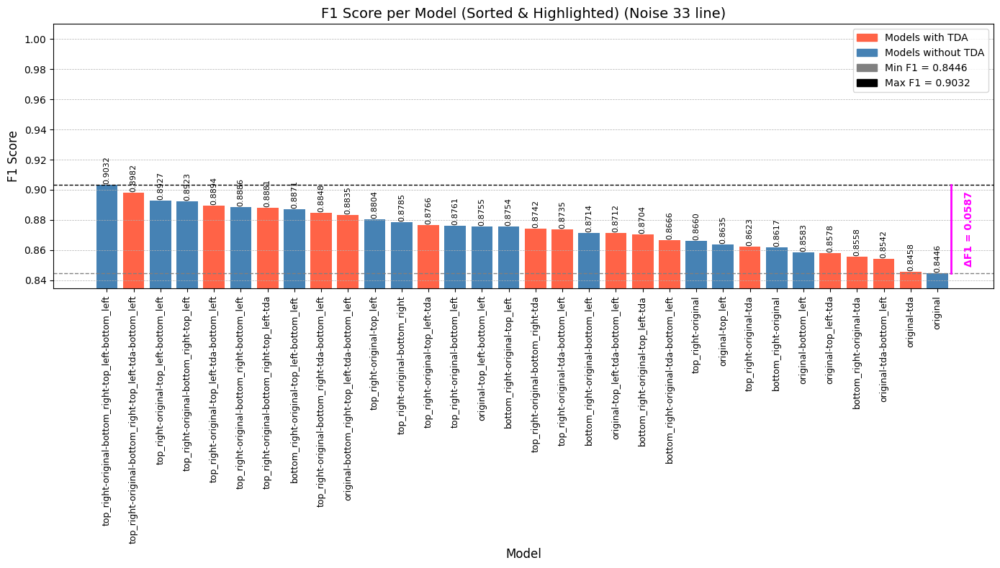

In [24]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q33_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_09-42-19.json"
plot_f1_scores(exp_q33_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 33 line)")

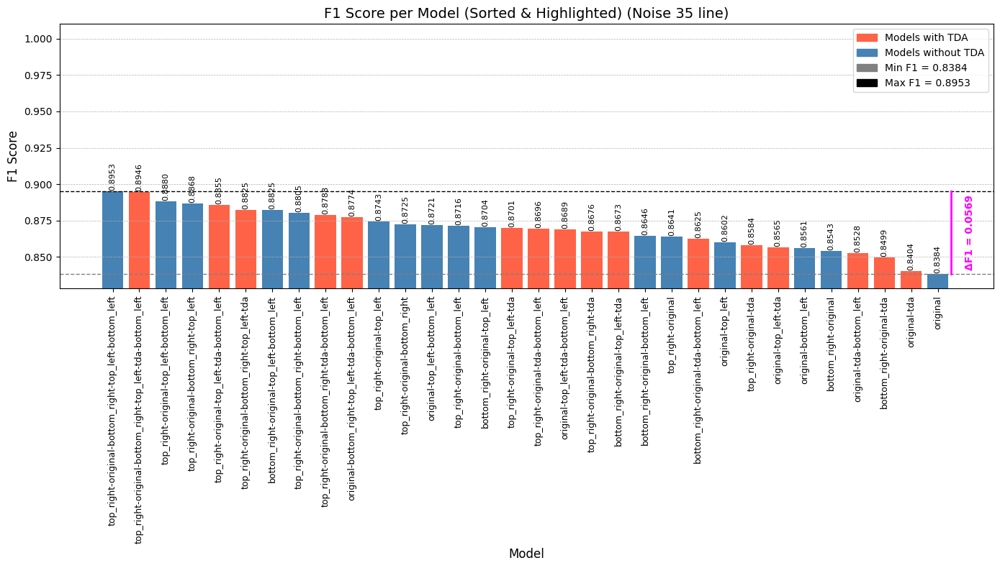

In [25]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q35_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_10-13-06.json"
plot_f1_scores(exp_q35_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 35 line)")

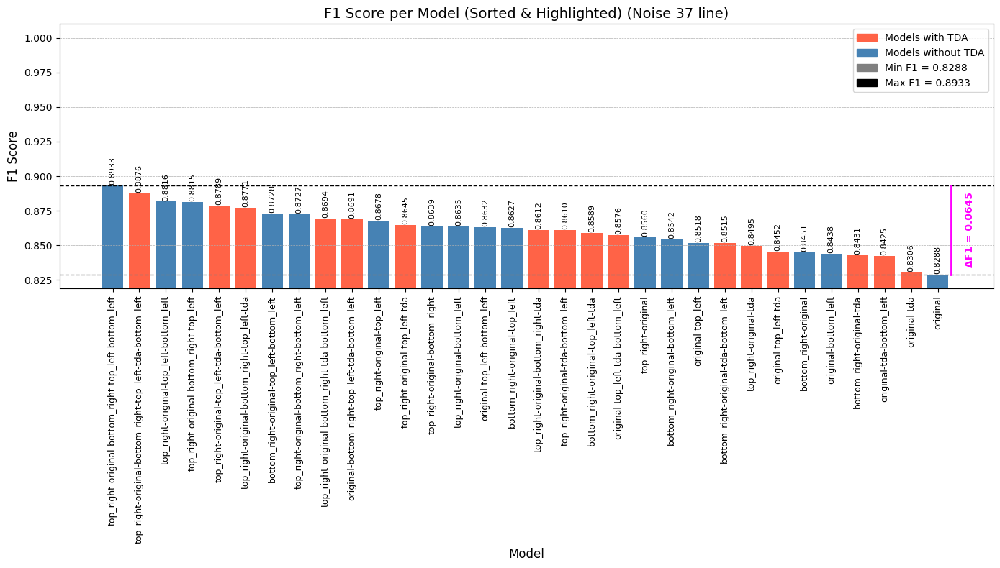

In [26]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q37_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_10-43-22.json"
plot_f1_scores(exp_q37_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 37 line)")

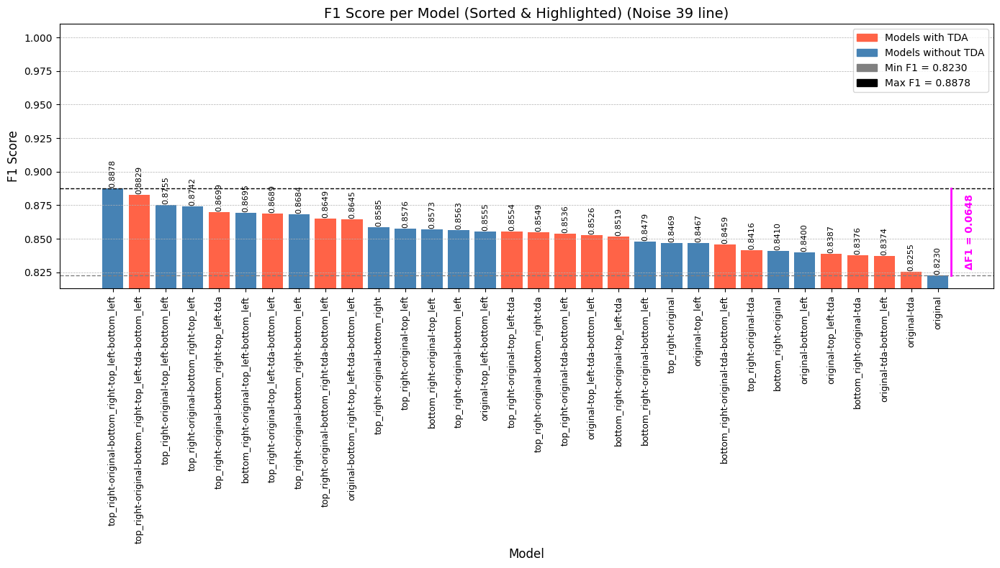

In [27]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q39_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_11-13-47.json"
plot_f1_scores(exp_q39_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 39 line)")

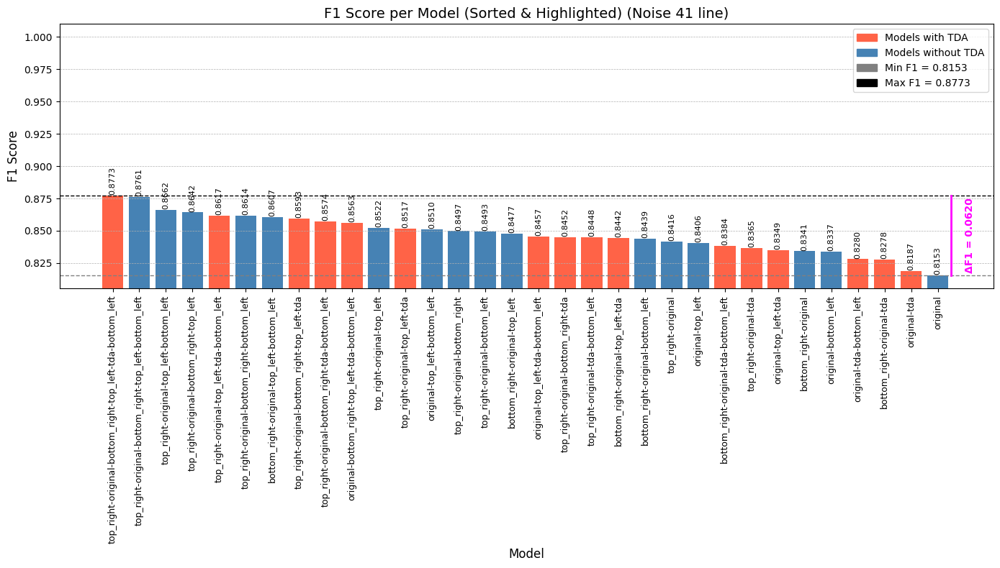

In [28]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q41_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_11-44-25.json"
plot_f1_scores(exp_q41_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 41 line)")

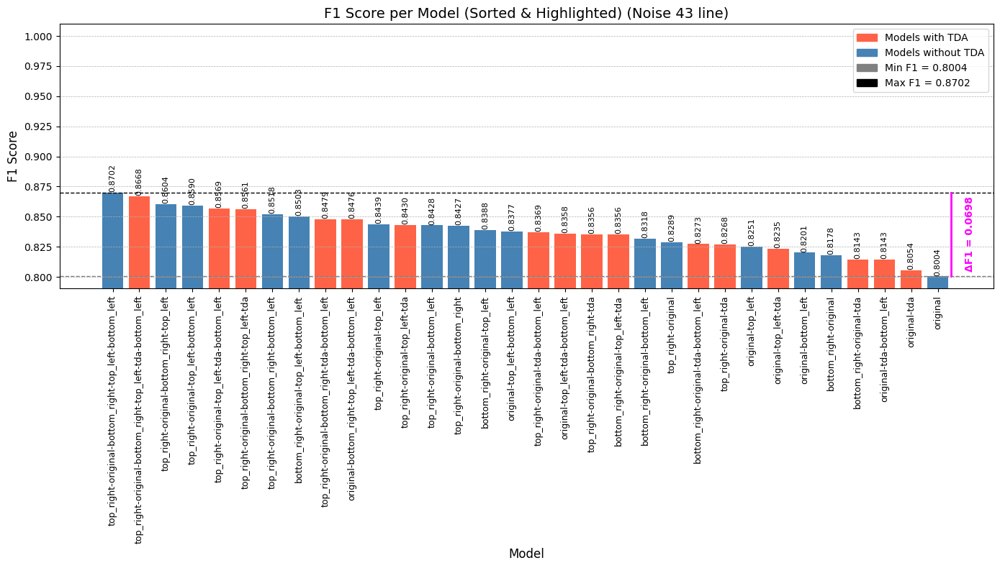

In [29]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q43_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_12-15-17.json"
plot_f1_scores(exp_q43_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 43 line)")

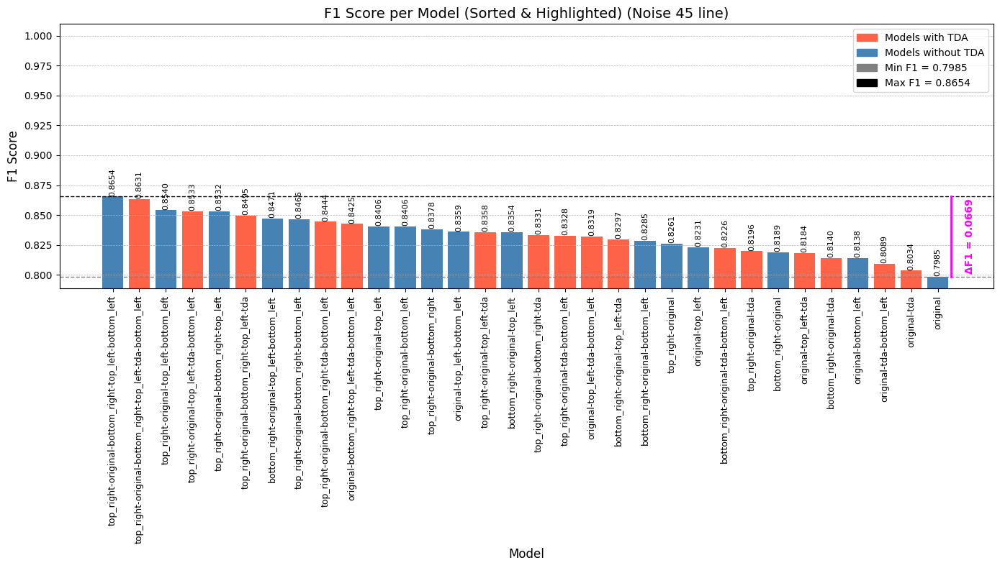

In [30]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q45_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_12-46-14.json"
plot_f1_scores(exp_q45_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 45 line)")

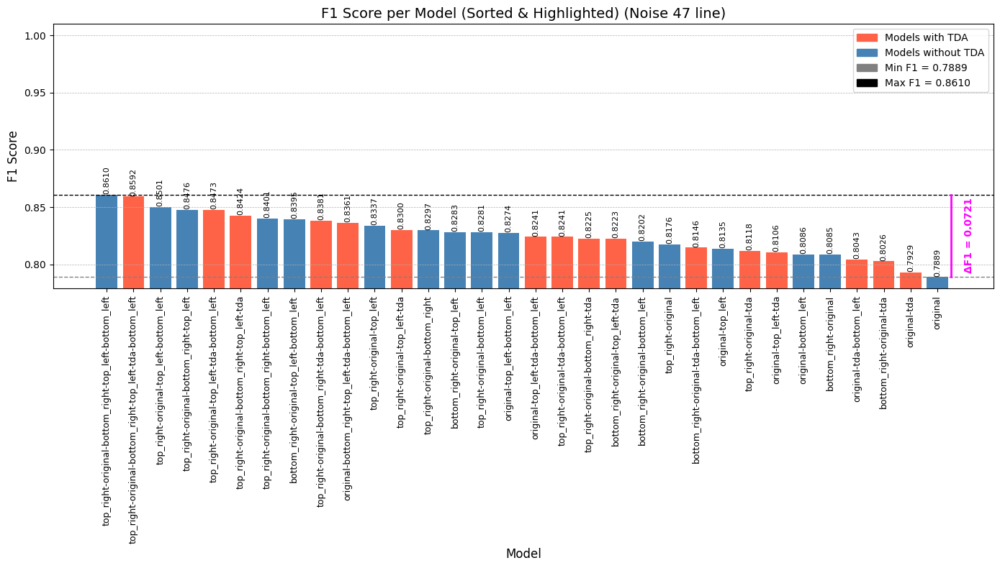

In [31]:
exp_dir = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
exp_q47_path = exp_dir / "experiment_trainsize_predictions_2025-04-26_13-18-17.json"
plot_f1_scores(exp_q47_path, title="F1 Score per Model (Sorted & Highlighted) (Noise 47 line)")

In [1]:
from analysis.metrics_extraction import interactive_f1_plot

In [7]:
base_path = Path("./results/exp_noise_lines_30_trainsplit_vary_noise/")
full_paths = [base_path / filename for filename in n_oldest_files]

In [8]:
interactive_f1_plot(full_paths, title_base="Experiment Noise Line Results")


interactive(children=(Dropdown(description='index', options=(0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22), value…

## Aggregated noise F1 score (17 samples)

In [4]:
from analysis.metrics_extraction import plot_aggregated_f1

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


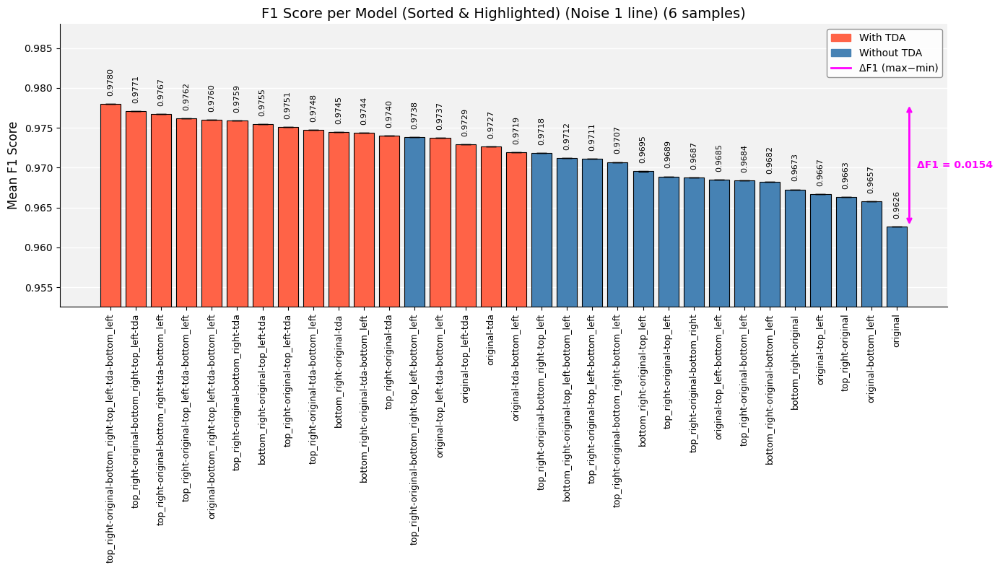

In [5]:
experiment_id=1
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![mnist_noise_lines_1](Visualizations/images_noise_lines/2025-04-28_23-37.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


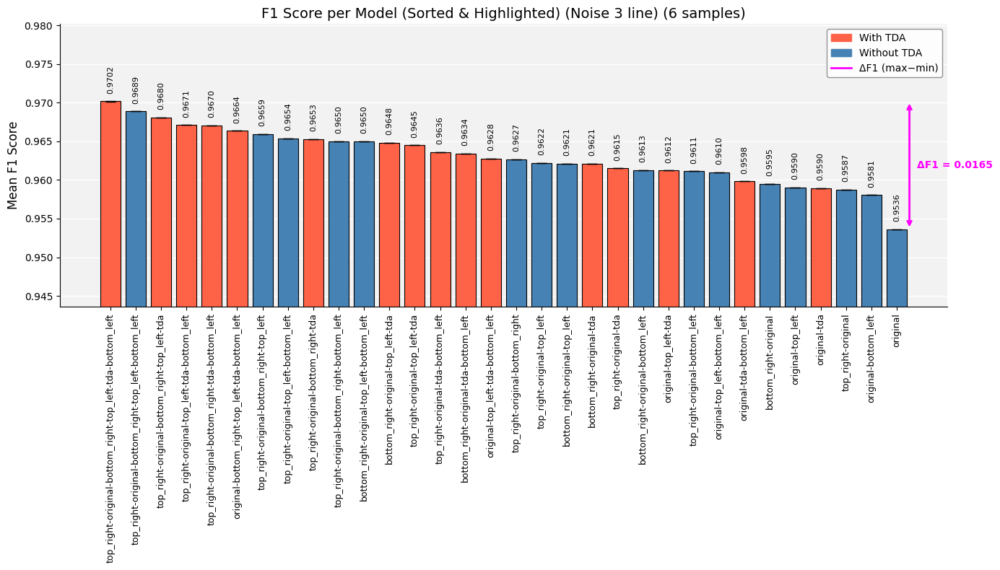

In [6]:
experiment_id=2
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_3_lines](Visualizations/images_noise_lines/noise_lines_3.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


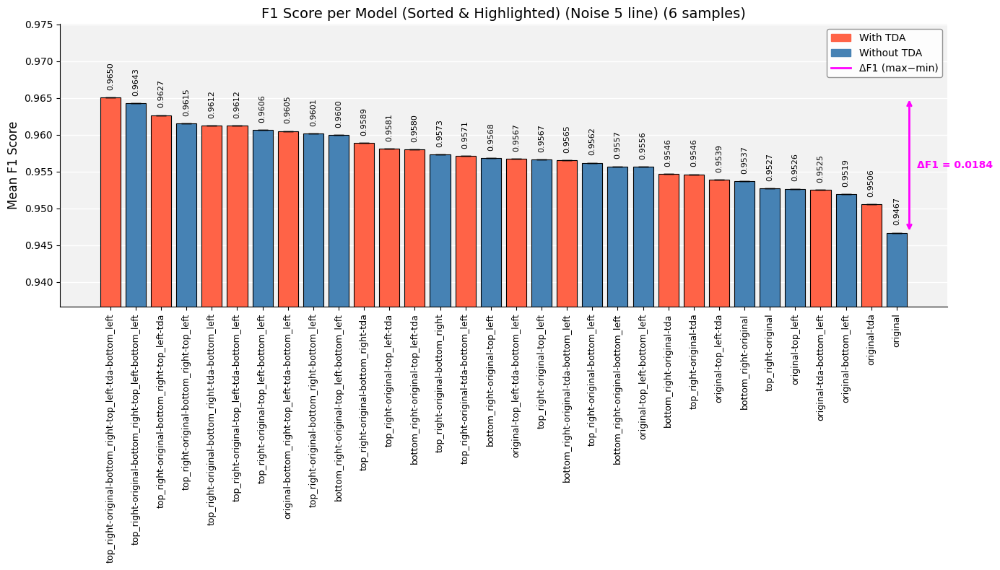

In [7]:
experiment_id=3
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_5_lines](Visualizations/images_noise_lines/noise_lines_5.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


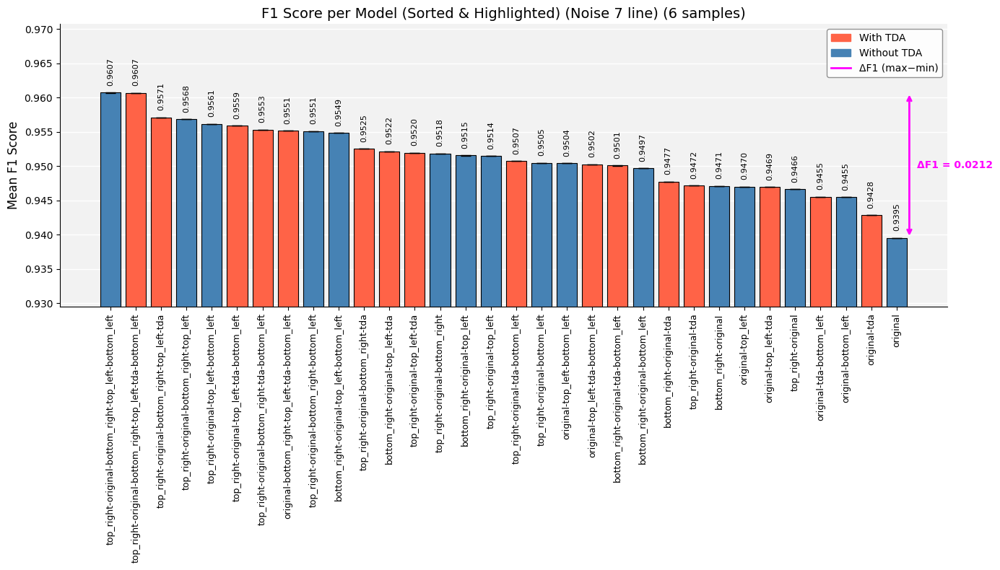

In [8]:
experiment_id=4
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_7_lines](Visualizations/images_noise_lines/noise_lines_7.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


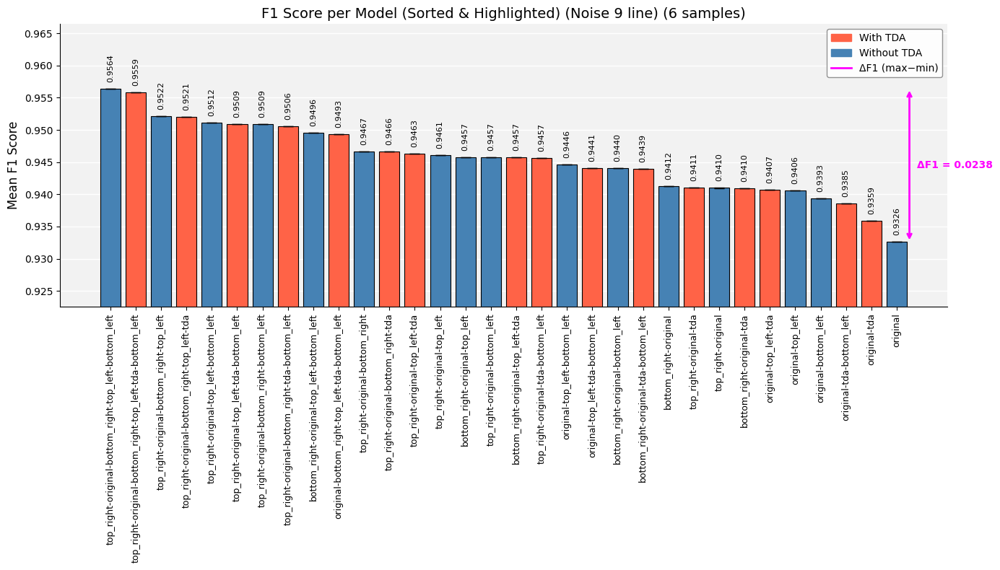

In [9]:
experiment_id=5
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_9_lines](Visualizations/images_noise_lines/noise_lines_9.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


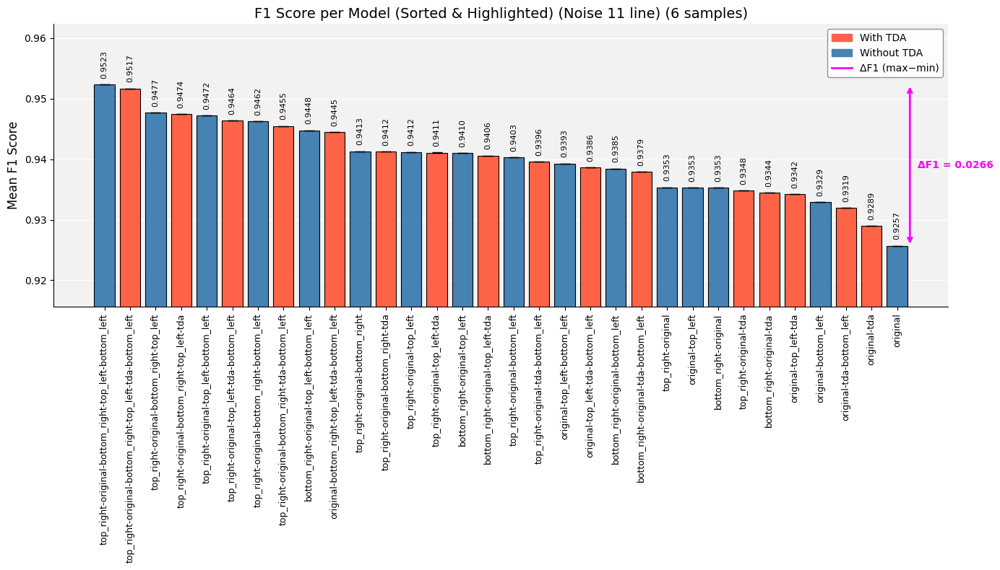

In [10]:
experiment_id=6
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_11_lines](Visualizations/images_noise_lines/noise_lines_11.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


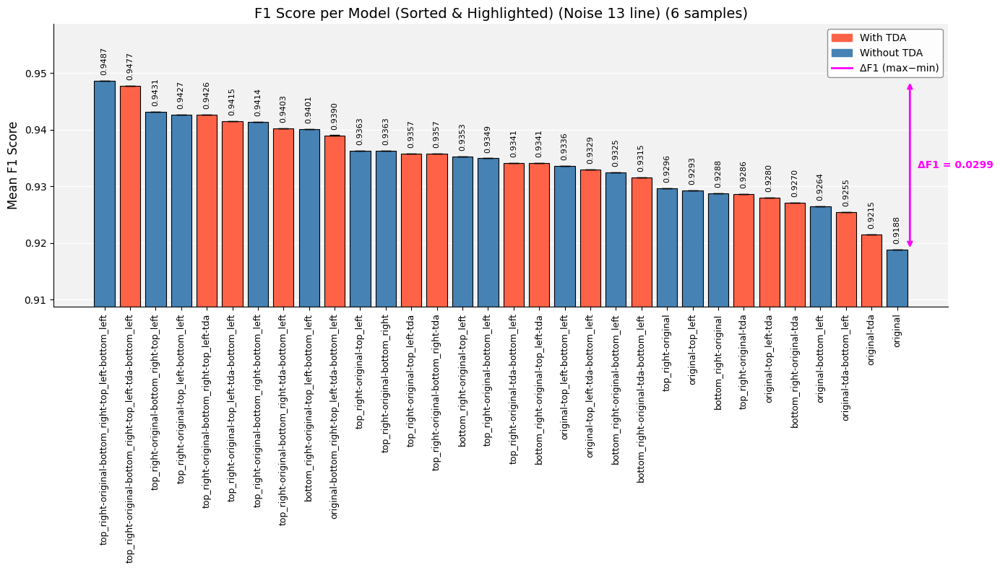

In [11]:
experiment_id=7
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_13_lines](Visualizations/images_noise_lines/noise_lines_13.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


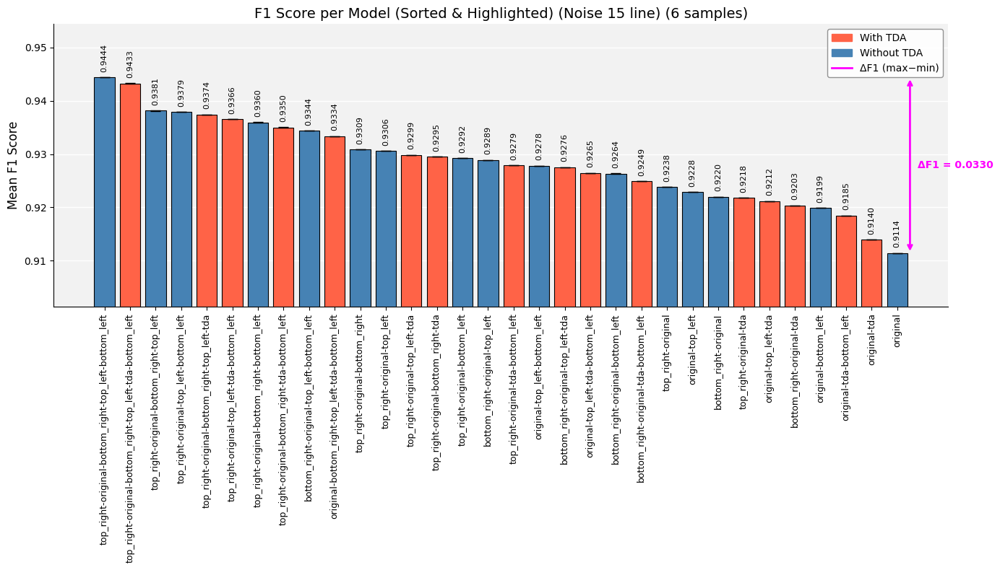

In [12]:
experiment_id=8
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_15_lines](Visualizations/images_noise_lines/noise_lines_15.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


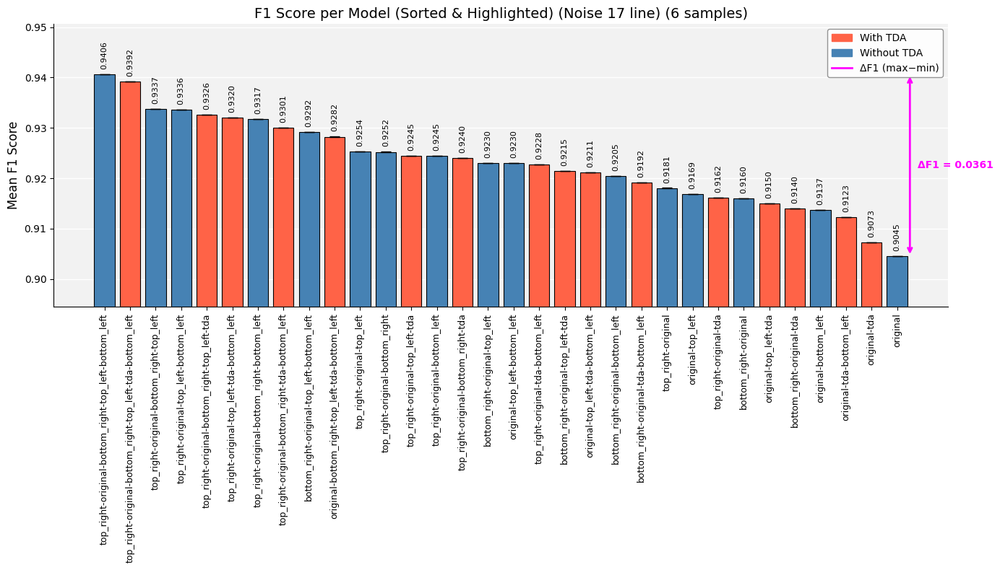

In [13]:
experiment_id=9
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_17_lines](Visualizations/images_noise_lines/noise_lines_17.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


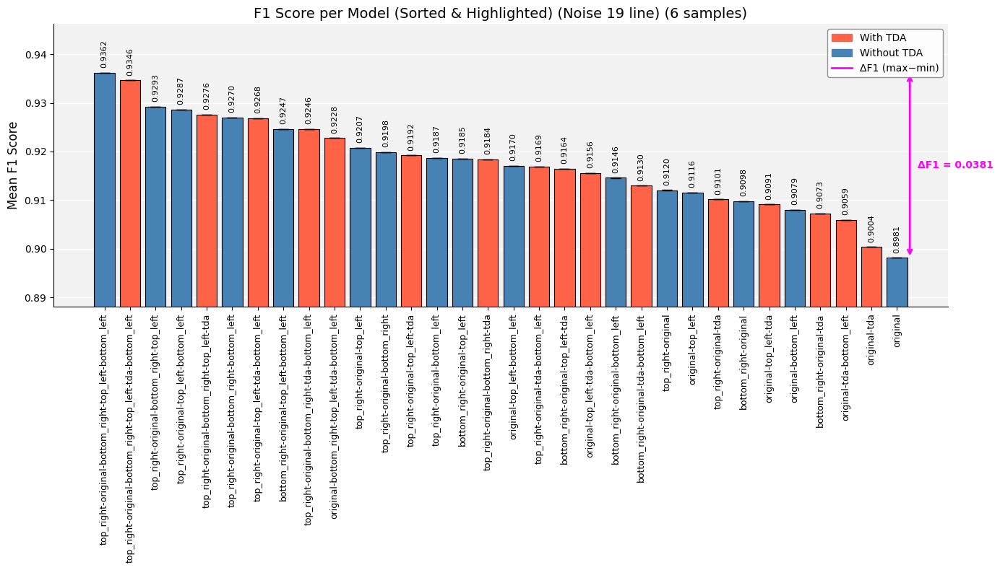

In [14]:
experiment_id=10
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_19_lines](Visualizations/images_noise_lines/noise_lines_19.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


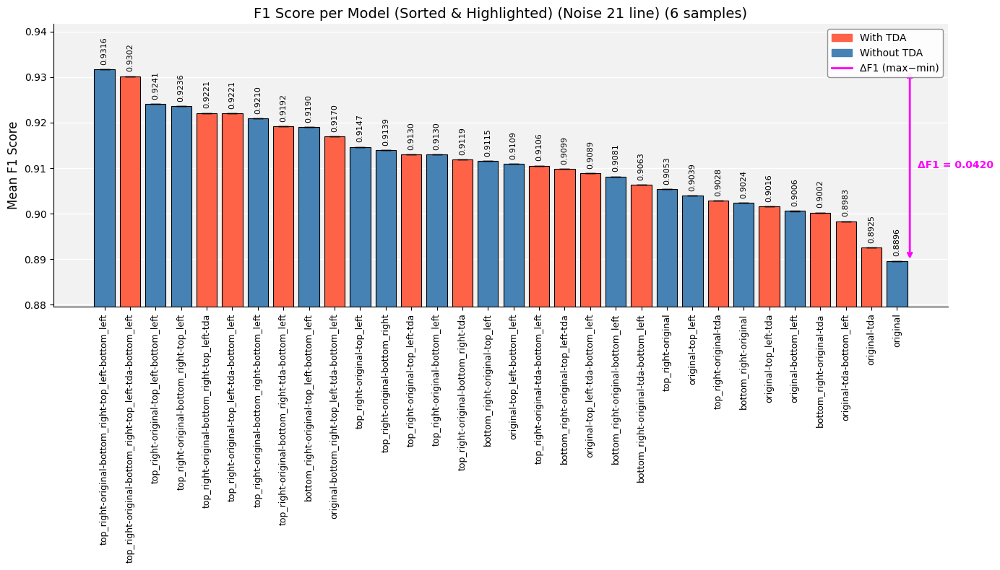

In [15]:
experiment_id=11
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_21_lines](Visualizations/images_noise_lines/noise_lines_21.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


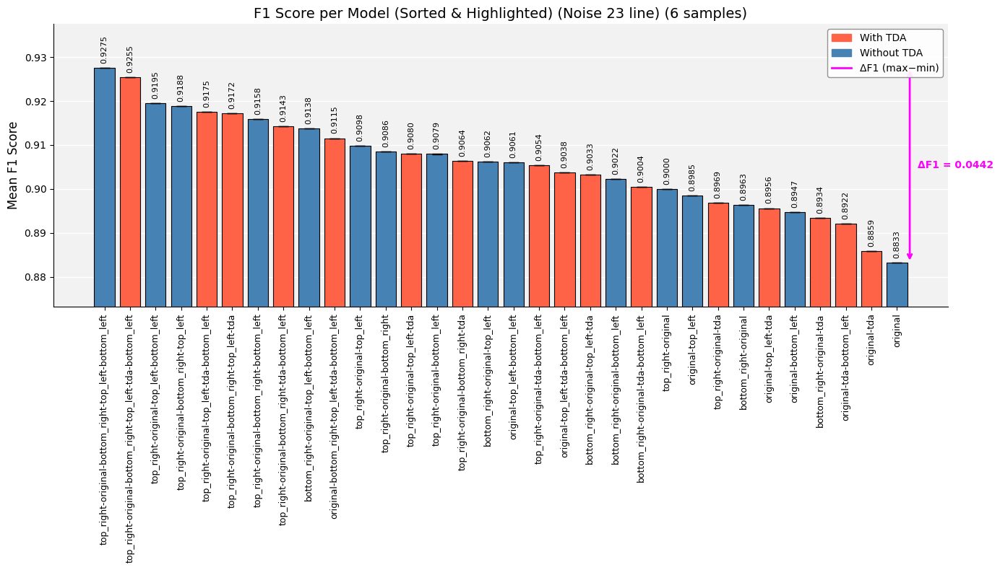

In [16]:
experiment_id=12
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_23_lines](Visualizations/images_noise_lines/noise_lines_23.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


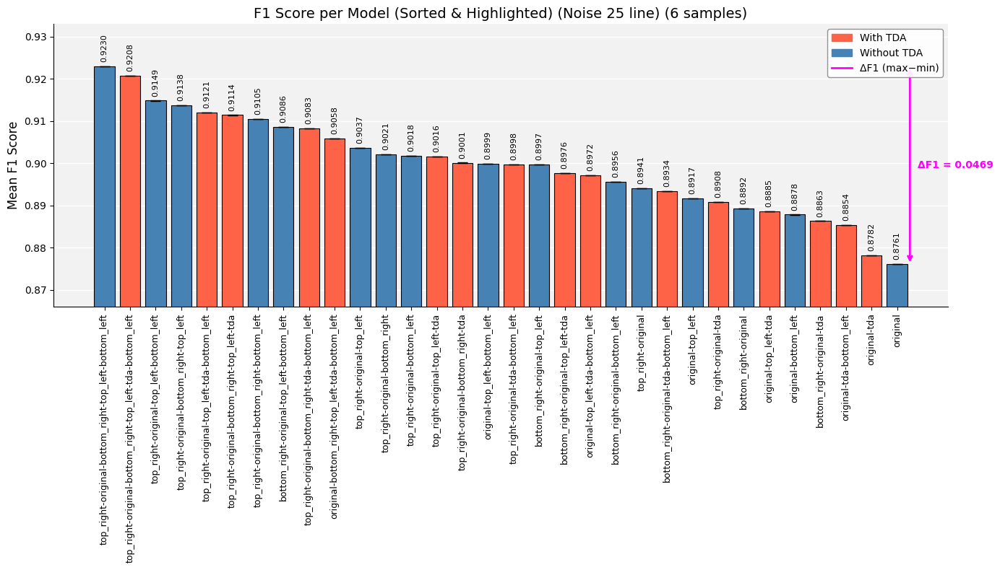

In [17]:
experiment_id=13
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_25_lines](Visualizations/images_noise_lines/noise_lines_25.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


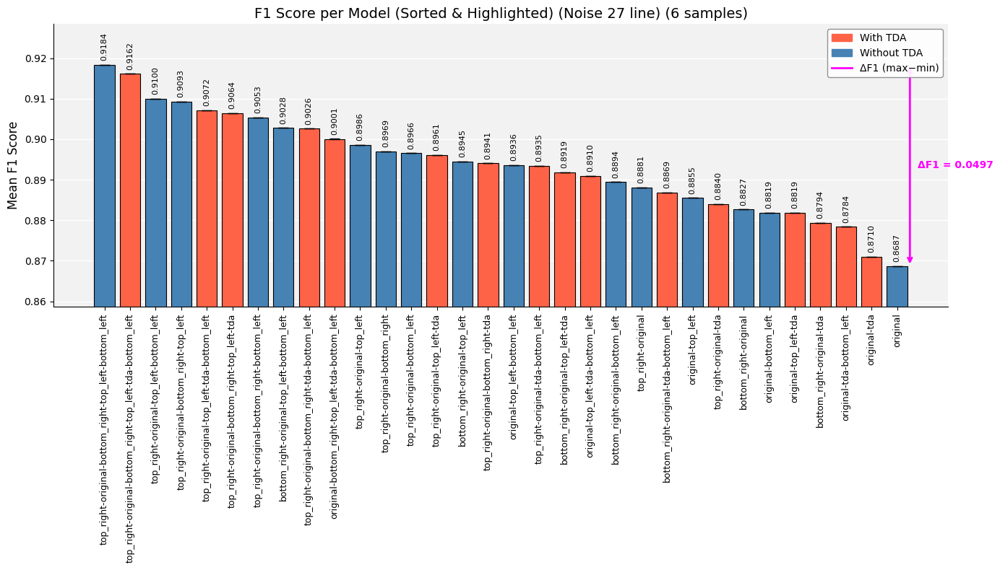

In [18]:
experiment_id=14
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


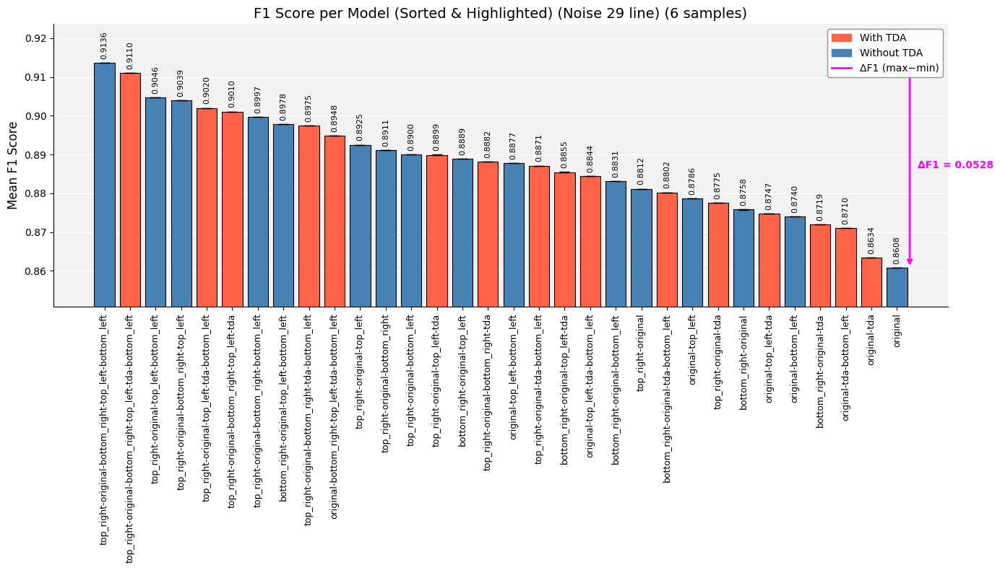

In [19]:
experiment_id=15
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_29_lines](Visualizations/images_noise_lines/noise_lines_29.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


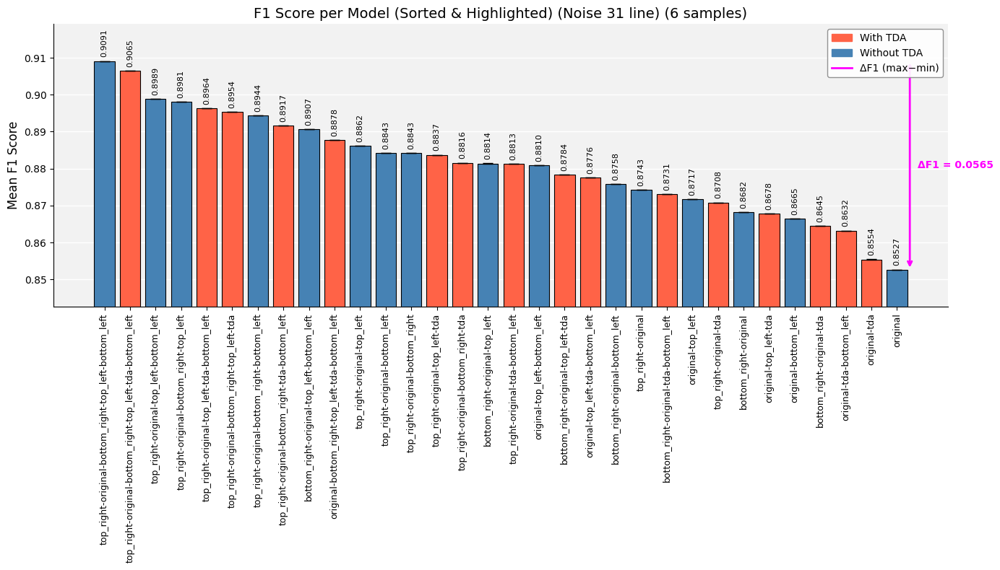

In [20]:
experiment_id=16
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_31_lines](Visualizations/images_noise_lines/noise_lines_31.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


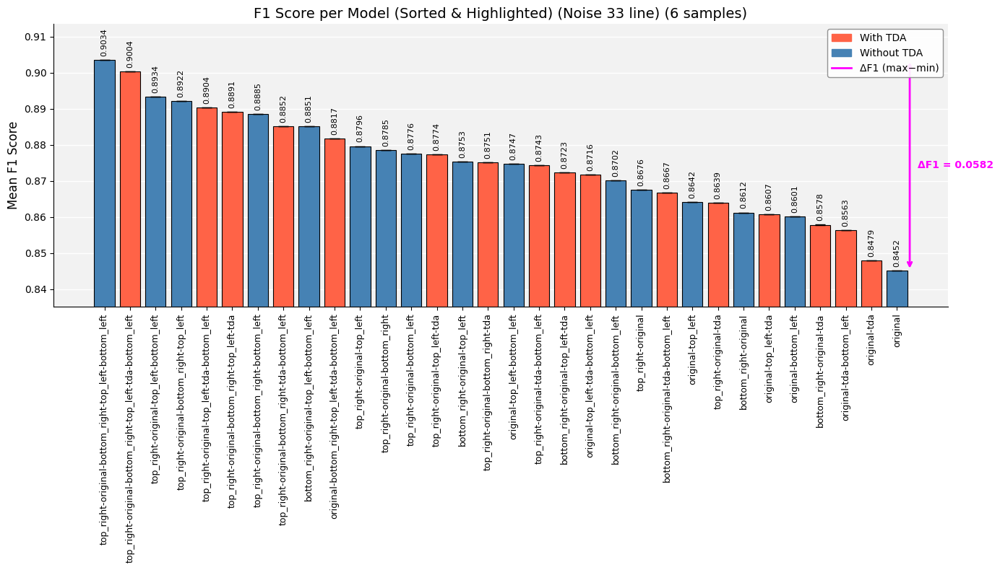

In [21]:
experiment_id=17
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_33_lines](Visualizations/images_noise_lines/noise_lines_33.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


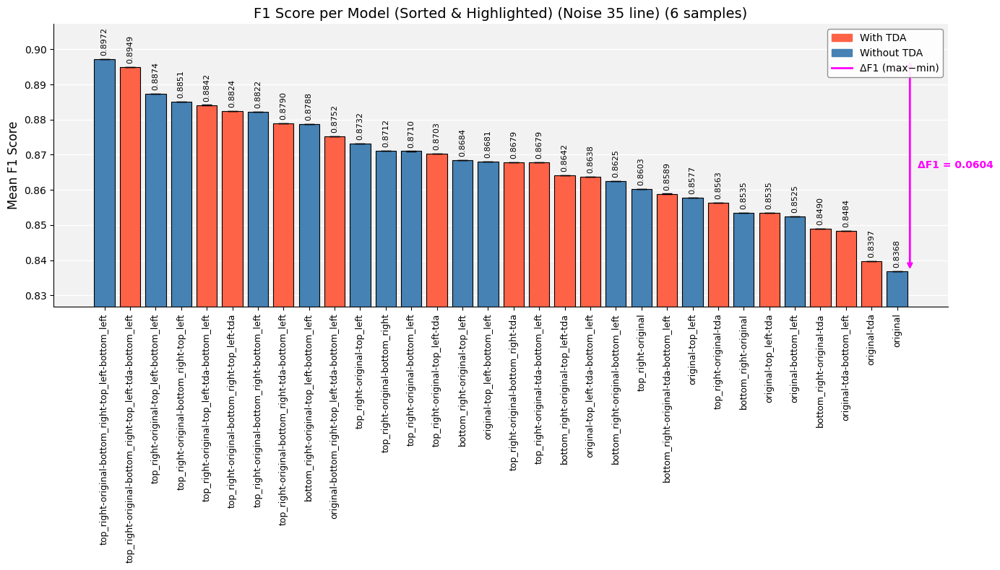

In [22]:
experiment_id=18
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_35_lines](Visualizations/images_noise_lines/noise_lines_35.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


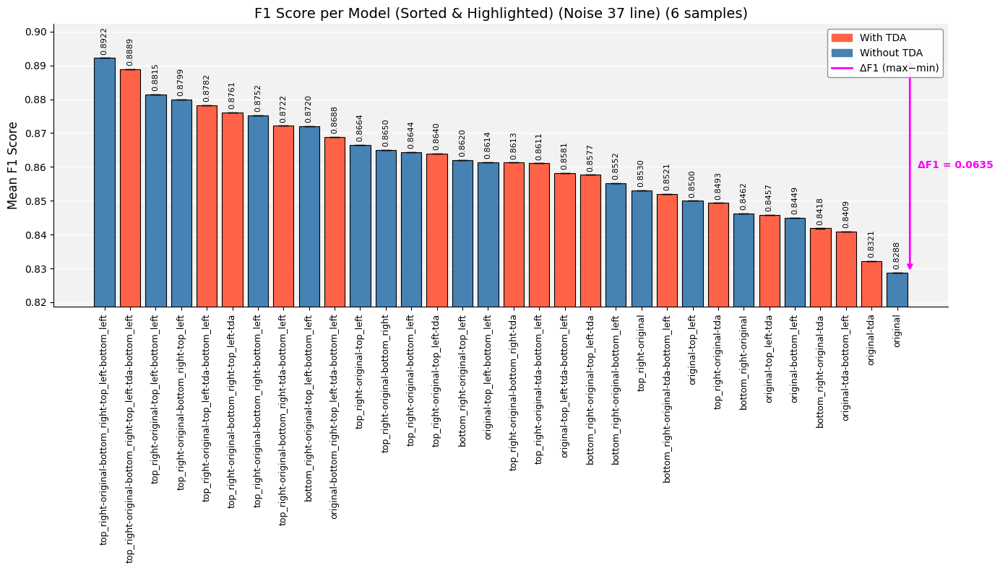

In [23]:
experiment_id=19
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_37_lines](Visualizations/images_noise_lines/noise_lines_37.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


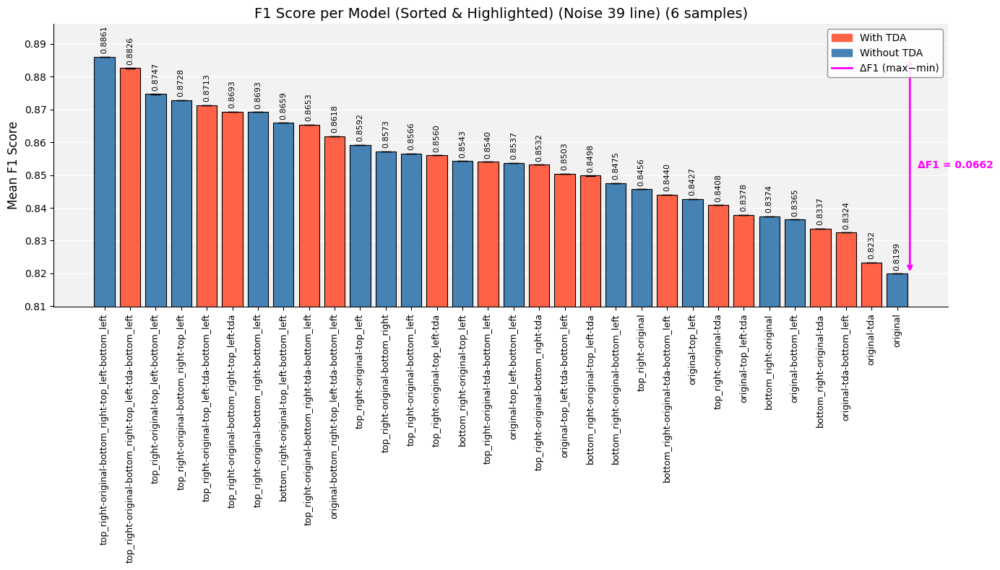

In [24]:
experiment_id=20
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_39_lines](Visualizations/images_noise_lines/noise_lines_39.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


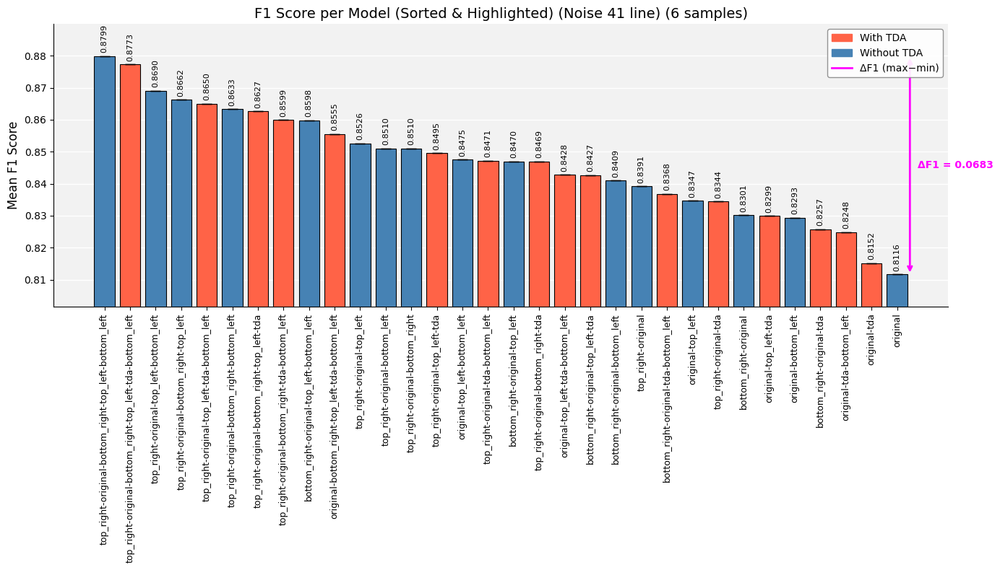

In [25]:
experiment_id=21
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_41_lines](Visualizations/images_noise_lines/noise_lines_41.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


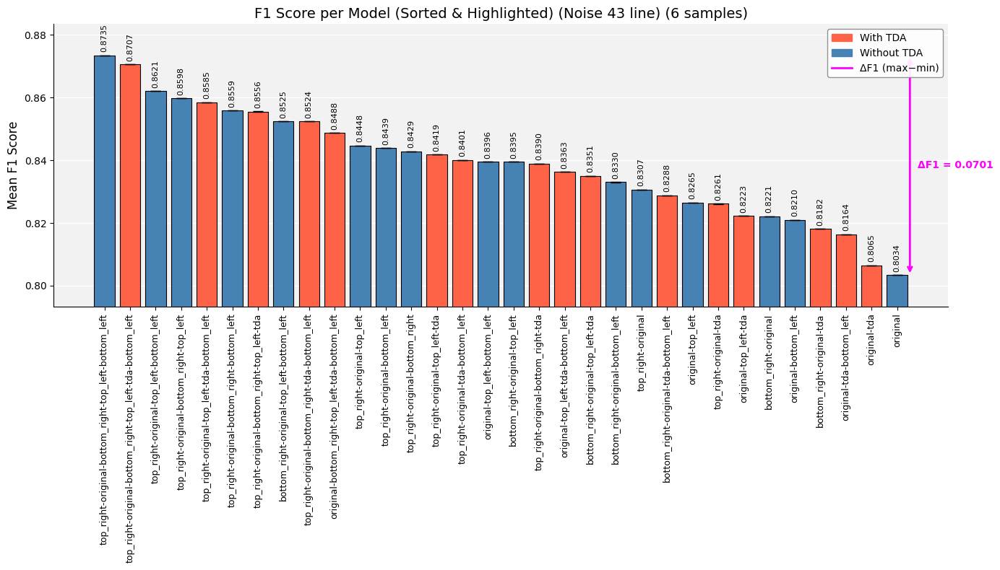

In [26]:
experiment_id=22
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_43_lines](Visualizations/images_noise_lines/noise_lines_43.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


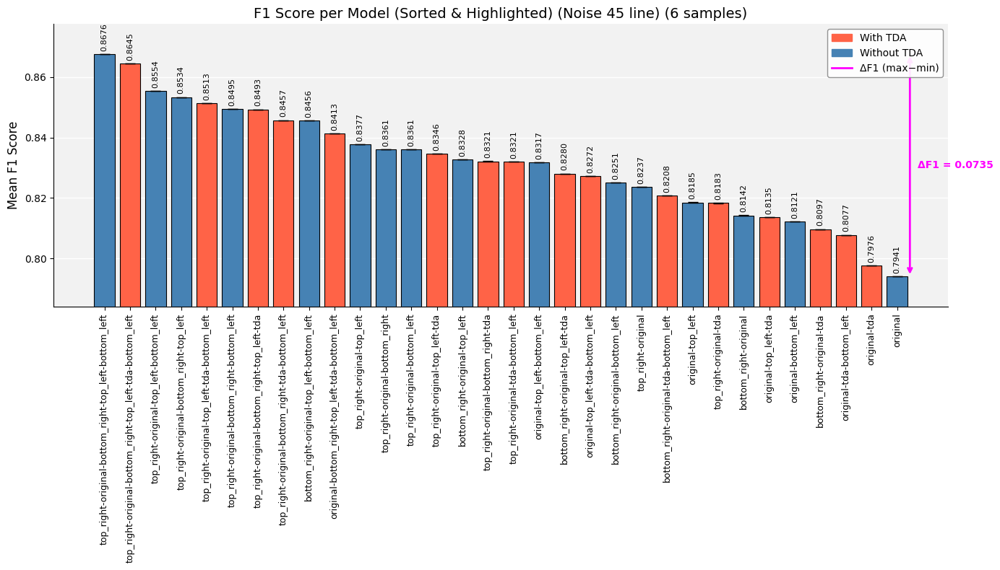

In [27]:
experiment_id=23
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_45_lines](Visualizations/images_noise_lines/noise_lines_45.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


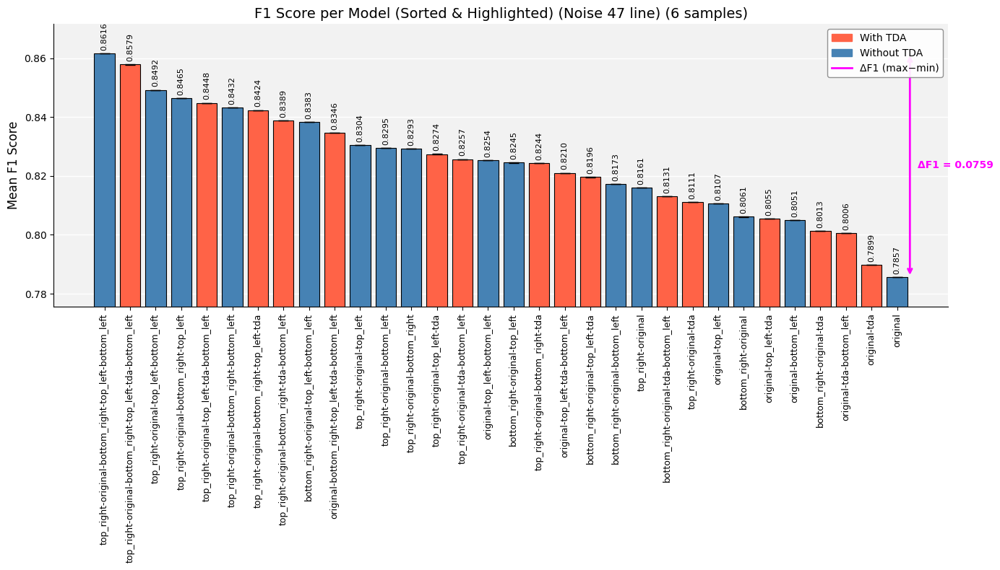

In [28]:
experiment_id=24
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_47_lines](Visualizations/images_noise_lines/noise_lines_47.png)

/home/jovyan/Workspace/workspace_mnist/analysis/metrics_extraction.py:163: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(models, rotation=90, fontsize=9)


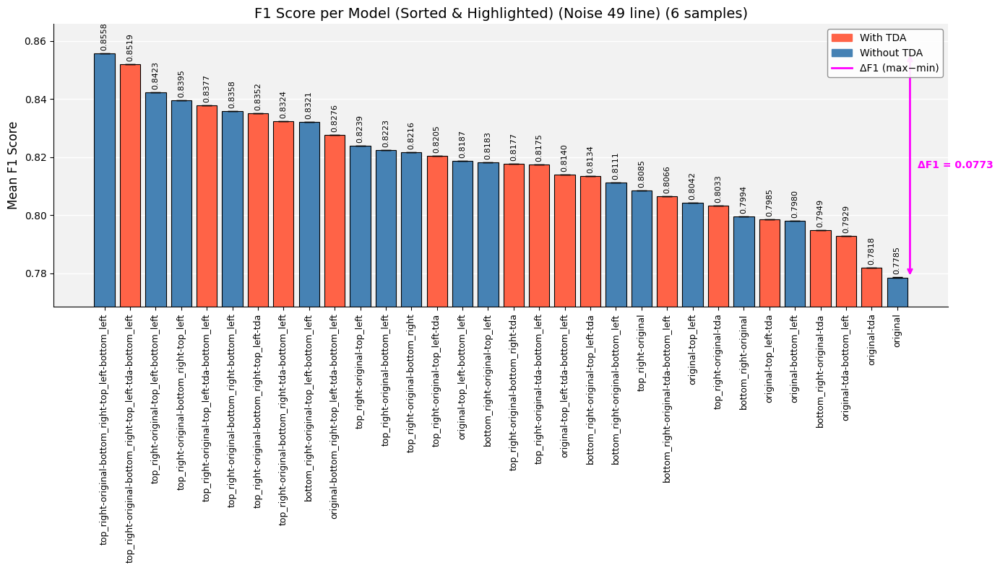

In [29]:
experiment_id=25
plot_aggregated_f1(json_paths=full_paths, experiment=experiment_id, title=f"F1 Score per Model (Sorted & Highlighted) (Noise {2*experiment_id - 1} line) (6 samples)")

![noise_49_lines](Visualizations/images_noise_lines/noise_lines_49.png)

- Grafica con las 30 samples, sobre delta diferencia max min, por cantidad de ruido
- Agregar al articulo las conclusiones del experimento

In [30]:
# Load MNIST
from experiment.files import *

In [31]:
df = pd.read_csv("./mnist_784.csv")

In [32]:
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy()

In [33]:
from experiment.noise import add_noise_to_data

In [34]:
from experiment.view import (
    split_and_reshape_quadrants, 
    reshape_to_square_image, 
    select_and_combine_views,
    generate_view_combinations,
    save_sample_views,
)

In [88]:
X_noise = add_noise_to_data(
            X,
            noise_type="salt",
            quantity=175,
            random_state=910968928
        )

In [89]:
X_noise_images = reshape_to_square_image(X_noise)

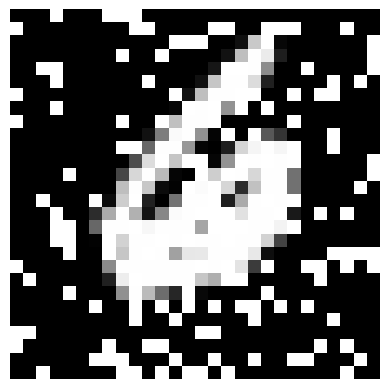

In [90]:
import matplotlib.pyplot as plt

image = X_noise_images[565]


plt.imshow(image, cmap='gray')  # for grayscale
plt.axis('off')
plt.show()

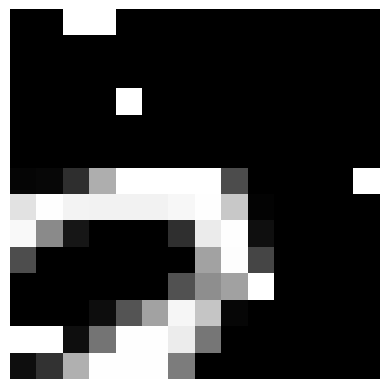

In [43]:

image = "results/exp_noise_salt_10_trainsplit_vary_noise/views/top_right/exp_noise_salt_10_trainsplit_vary_noise_2025-05-05_21-29-54_11.png"
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img = mpimg.imread(image)
plt.imshow(img)
plt.axis('off')  # Hide axis for a cleaner view
plt.show()


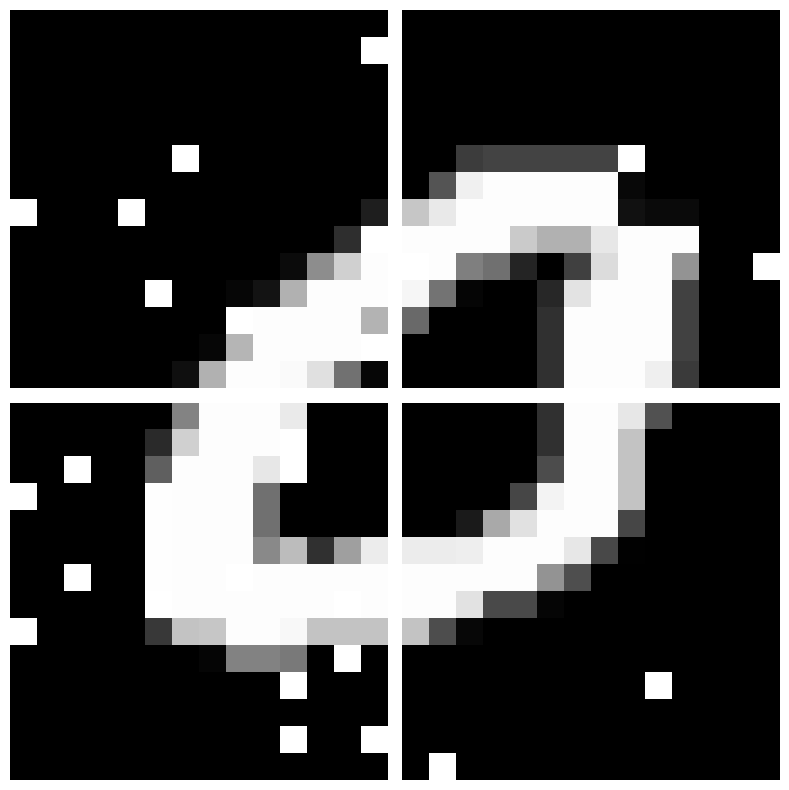

In [112]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


exp_image = f"exp_noise_salt_10_trainsplit_vary_noise_2025-05-06_08-15-18_0.png"

# List your image paths
images = [
    f"./results/exp_noise_salt_10_trainsplit_vary_noise/views/top_left/{exp_image}",
    f"./results/exp_noise_salt_10_trainsplit_vary_noise/views/top_right/{exp_image}",
    f"./results/exp_noise_salt_10_trainsplit_vary_noise/views/bottom_left/{exp_image}",
    f"./results/exp_noise_salt_10_trainsplit_vary_noise/views/bottom_right/{exp_image}"
]

fig, axes = plt.subplots(2, 2, figsize=(8, 8))

for ax, img_path in zip(axes.flat, images):
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.axis('off')  # Hide axes for a minimalist look

plt.tight_layout()
plt.savefig(f"./Visualizations/images_noise_salt/{exp_image}", dpi=300, bbox_inches='tight')  # Save before showing
plt.show()


## Analysis Results Experiment Salt and Pepper Noise 1 Sample Varying Noise Size

In [45]:
path_exp_dir = Path("./results/exp_noise_salt_10_trainsplit_vary_noise")
n_oldest_files = get_n_oldest_files(path_exp_dir, n=12)

base_path = Path("./results/exp_noise_salt_10_trainsplit_vary_noise")
full_paths = [base_path / filename for filename in n_oldest_files]

In [52]:
full_paths[0]

PosixPath('results/exp_noise_salt_10_trainsplit_vary_noise/exp_noise_salt_10_trainsplit_vary_noise_2025-05-06_03-00-21.json')

In [50]:
exp_dir = Path("./results/exp_noise_salt_10_trainsplit_vary_noise")
exp_q25_salt_path = exp_dir / "exp_noise_salt_10_trainsplit_vary_noise_2025-05-06_03-00-21.json'"


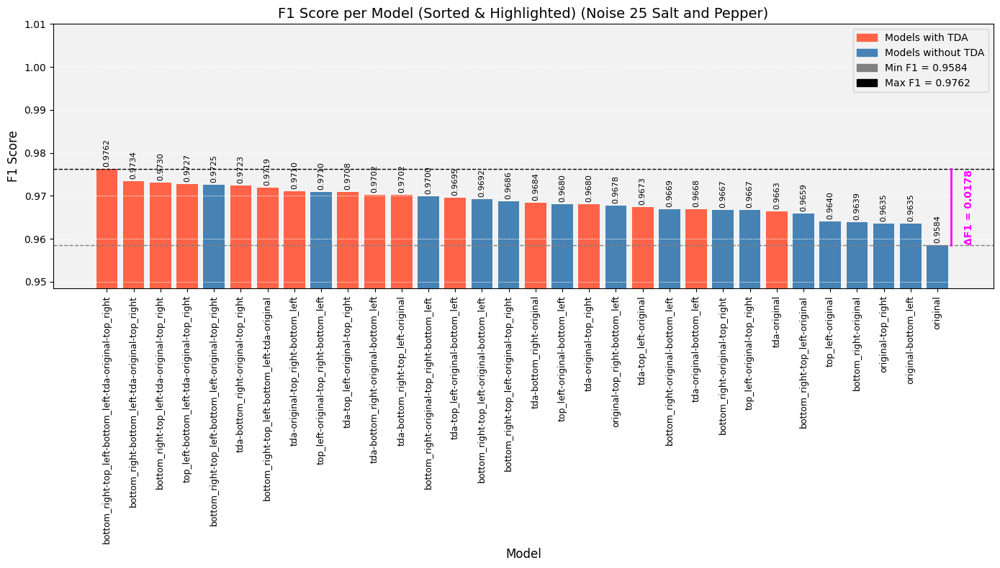

In [53]:
plot_f1_scores(full_paths[0], title="F1 Score per Model (Sorted & Highlighted) (Noise 25 Salt and Pepper)")

![noise_25_salt](Visualizations/images_noise_salt/exp_noise_salt_10_trainsplit_vary_noise_2025-05-06_02-34-05_0.png)

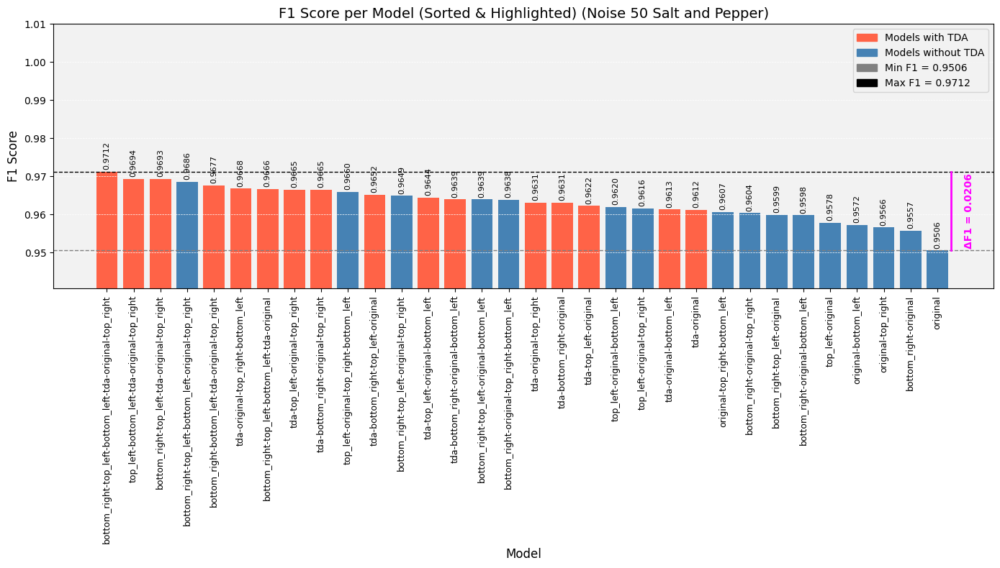

In [54]:
index = 1
noise_quantity = (index + 1) * 25
plot_f1_scores(full_paths[index], title=f"F1 Score per Model (Sorted & Highlighted) (Noise {noise_quantity} Salt and Pepper)")

In [ ]:
![noise_35_lines](Visualizations/images_noise_salt/exp_noise_salt_10_trainsplit_vary_noise_2025-05-06_02-34-05_0.png)

In [ ]:
Workspace/workspace_mnist/results/exp_noise_salt_10_trainsplit_vary_noise/views/top_left/exp_noise_salt_10_trainsplit_vary_noise_2025-05-06_02-34-05_8.png

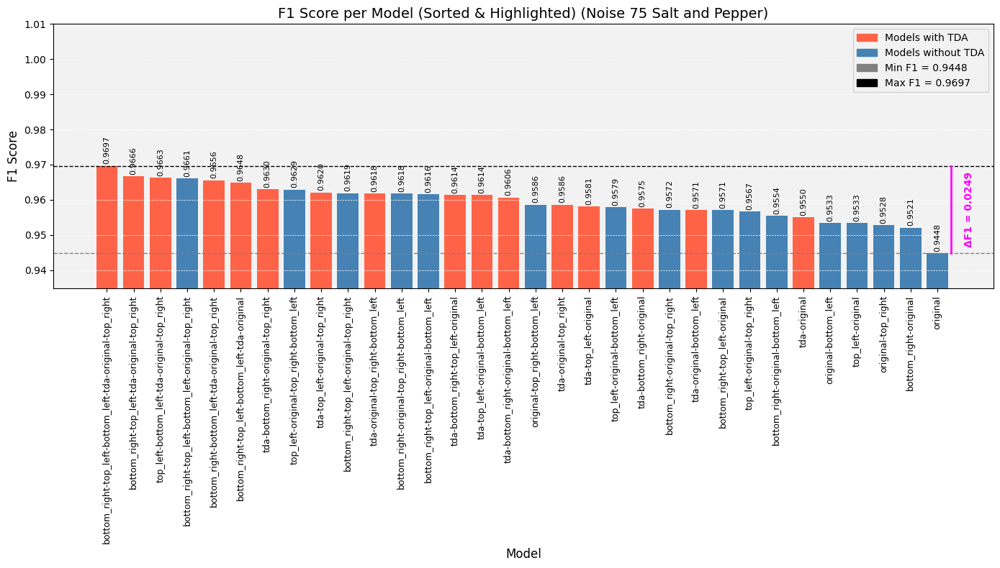

In [55]:
index = 2
noise_quantity = (index + 1) * 25
plot_f1_scores(full_paths[index], title=f"F1 Score per Model (Sorted & Highlighted) (Noise {noise_quantity} Salt and Pepper)")

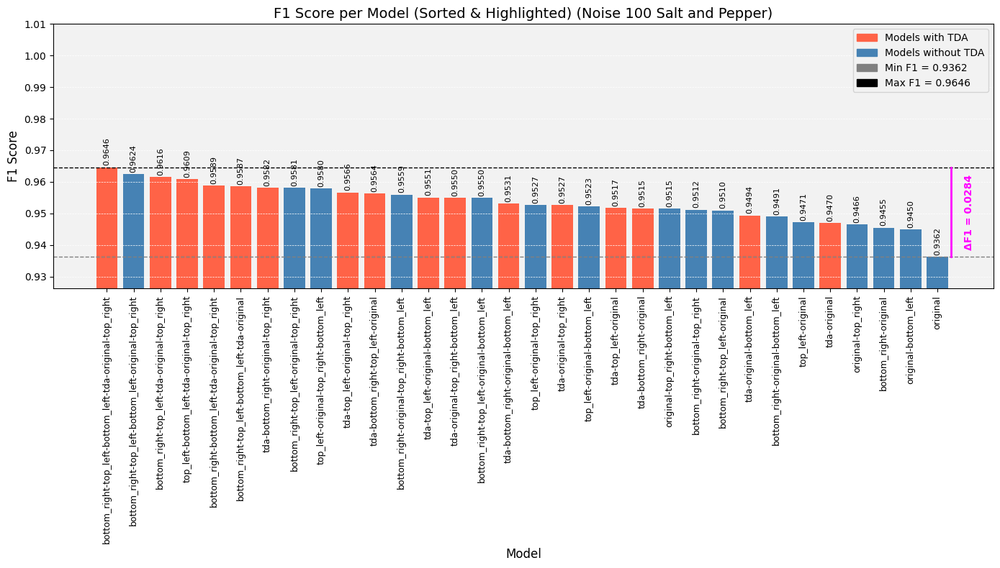

In [56]:
index = 3
noise_quantity = (index + 1) * 25
plot_f1_scores(full_paths[index], title=f"F1 Score per Model (Sorted & Highlighted) (Noise {noise_quantity} Salt and Pepper)")

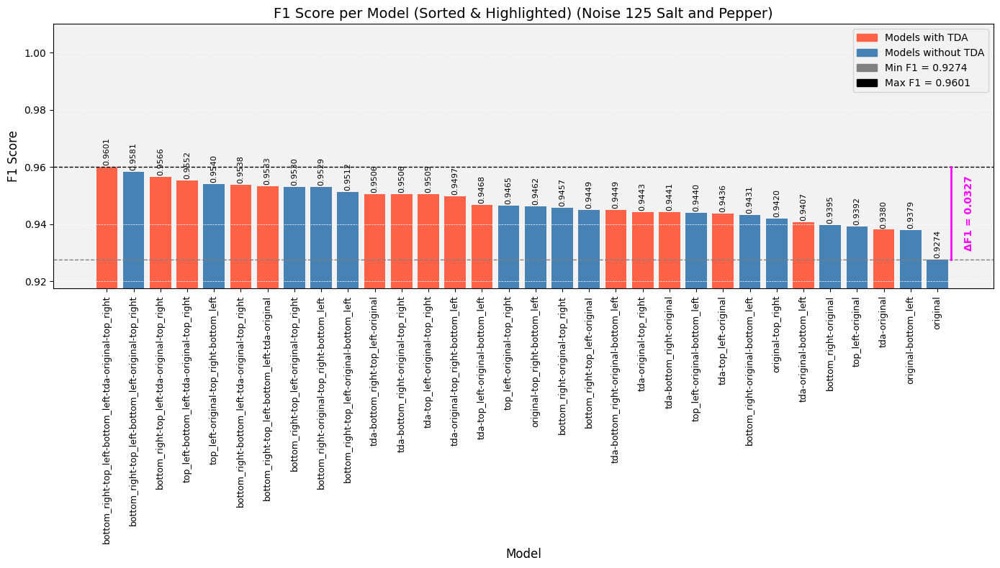

In [57]:
index = 4
noise_quantity = (index + 1) * 25
plot_f1_scores(full_paths[index], title=f"F1 Score per Model (Sorted & Highlighted) (Noise {noise_quantity} Salt and Pepper)")

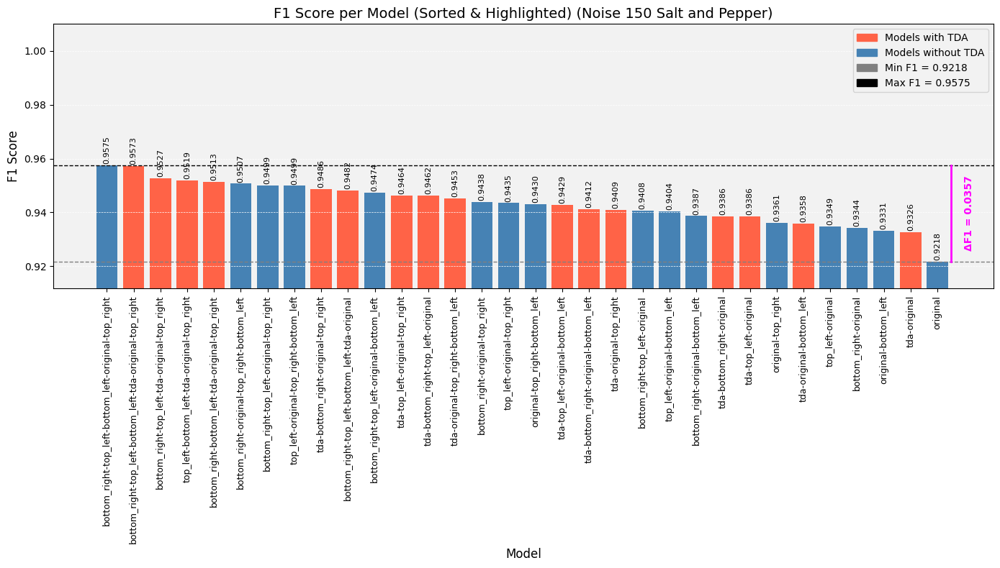

In [58]:
index = 5
noise_quantity = (index + 1) * 25
plot_f1_scores(full_paths[index], title=f"F1 Score per Model (Sorted & Highlighted) (Noise {noise_quantity} Salt and Pepper)")

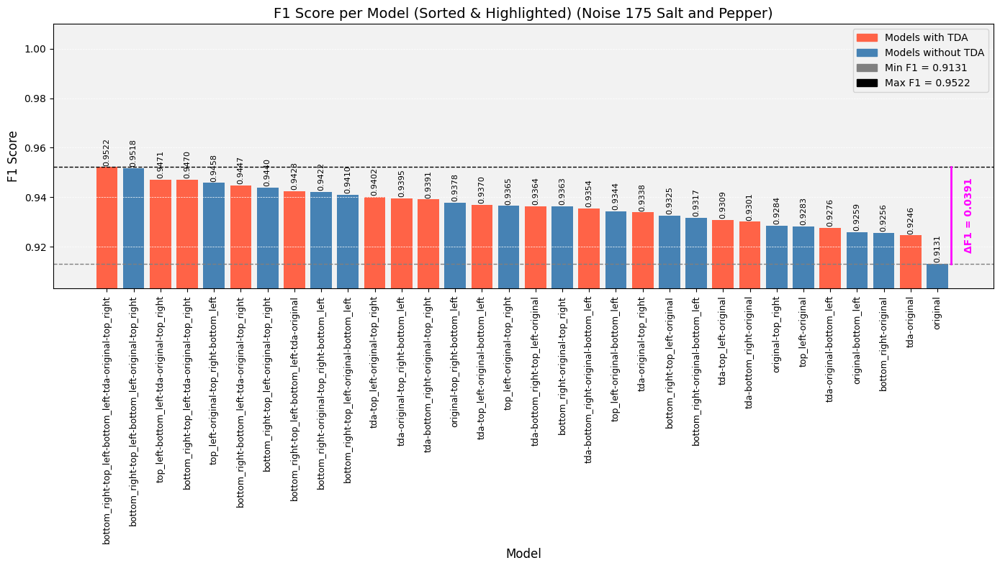

In [59]:
index = 6
noise_quantity = (index + 1) * 25
plot_f1_scores(full_paths[index], title=f"F1 Score per Model (Sorted & Highlighted) (Noise {noise_quantity} Salt and Pepper)")

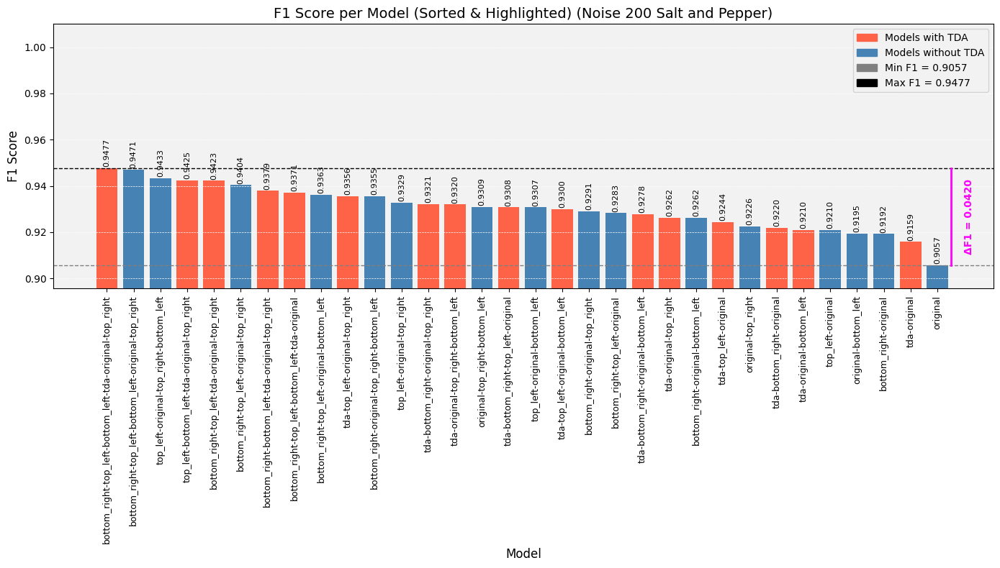

In [60]:
index = 7
noise_quantity = (index + 1) * 25
plot_f1_scores(full_paths[index], title=f"F1 Score per Model (Sorted & Highlighted) (Noise {noise_quantity} Salt and Pepper)")

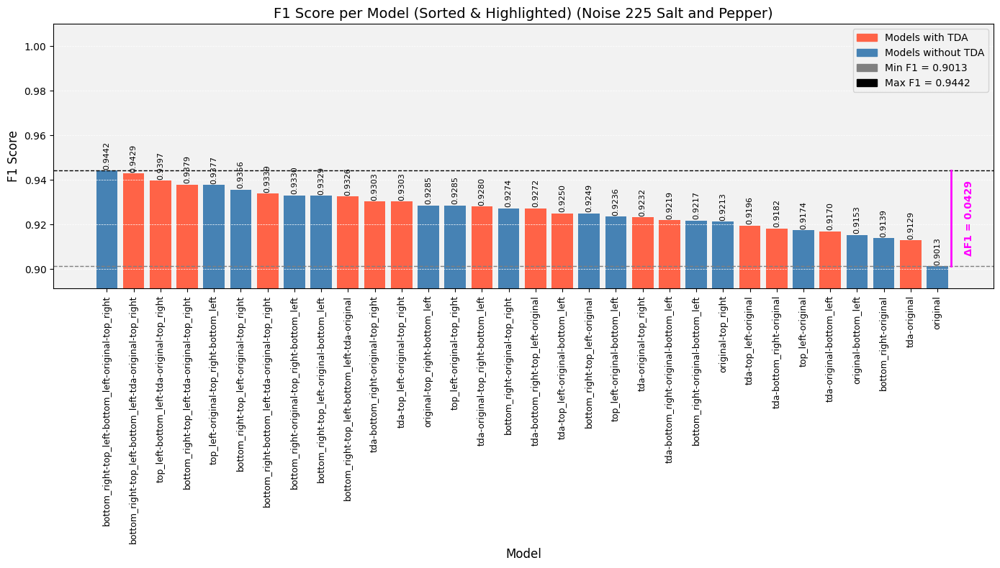

In [61]:
index = 8
noise_quantity = (index + 1) * 25
plot_f1_scores(full_paths[index], title=f"F1 Score per Model (Sorted & Highlighted) (Noise {noise_quantity} Salt and Pepper)")

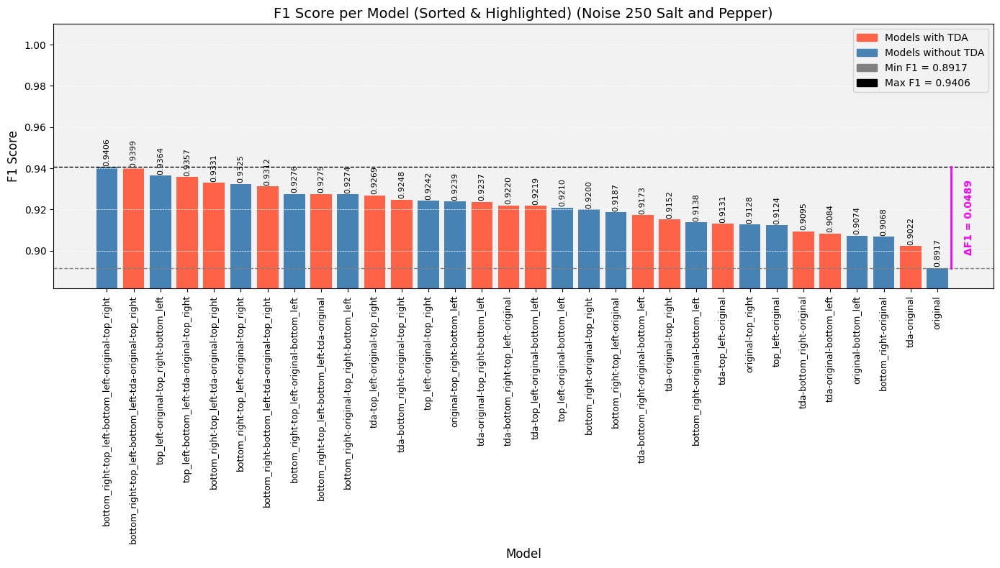

In [62]:
index = 9
noise_quantity = (index + 1) * 25
plot_f1_scores(full_paths[index], title=f"F1 Score per Model (Sorted & Highlighted) (Noise {noise_quantity} Salt and Pepper)")

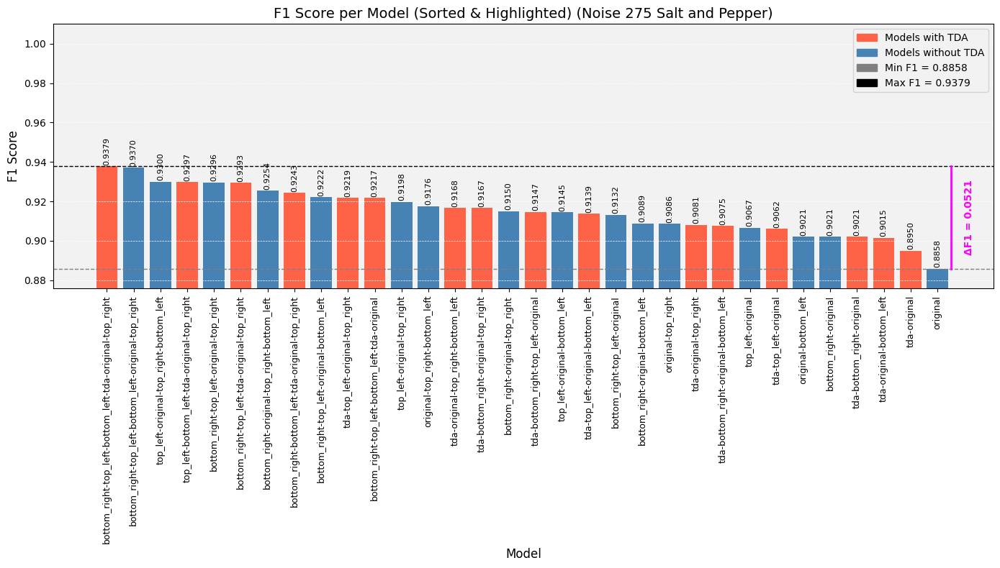

In [63]:
index = 10
noise_quantity = (index + 1) * 25
plot_f1_scores(full_paths[index], title=f"F1 Score per Model (Sorted & Highlighted) (Noise {noise_quantity} Salt and Pepper)")

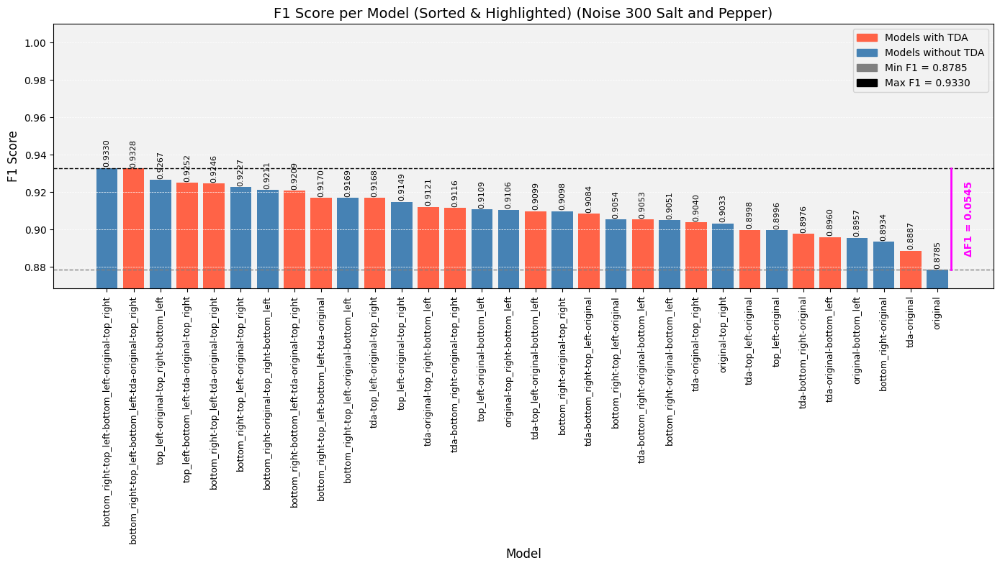

In [64]:
index = 11
noise_quantity = (index + 1) * 25
plot_f1_scores(full_paths[index], title=f"F1 Score per Model (Sorted & Highlighted) (Noise {noise_quantity} Salt and Pepper)")